In [1]:
from google.colab import drive
drive.mount('/content/drive')
import os
folder_path = '/content/drive/MyDrive/Electricity-Power'
os.chdir(folder_path)


Mounted at /content/drive


In [2]:
import os
from tqdm import tqdm
import warnings
warnings.filterwarnings("ignore")
import json
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import gc

### Missing values

all features for predicting other features

In [79]:
df = pd.read_csv('hourly_resampled_df_19052_196.csv')
df.shape
df.set_index('End date', inplace=True)


selected features

In [ ]:
df = pd.read_csv('resampled_selected_features_19052_82.csv')
df.shape
df.set_index('End date', inplace=True)

#### features with less 5 %

In [80]:
missed = pd.DataFrame({
    'column_name': df.columns,
    'number_of_missing_values': df.isnull().sum(),
    'percentage_of_missing_values': (df.isnull().sum() / len(df)) * 100
})
missed[(missed['percentage_of_missing_values'] < 5) & (missed['percentage_of_missing_values'] >0)]

,column_name,number_of_missing_values,percentage_of_missing_values
Actual_generation_Biomass [MWh],Actual_generation_Biomass [MWh],5,0.026244
Actual_generation_Hydropower [MWh],Actual_generation_Hydropower [MWh],5,0.026244
Actual_generation_Wind offshore [MWh],Actual_generation_Wind offshore [MWh],4,0.020995
Actual_generation_Wind onshore [MWh],Actual_generation_Wind onshore [MWh],5,0.026244
Actual_generation_Photovoltaics [MWh],Actual_generation_Photovoltaics [MWh],5,0.026244
...,...,...,...
price_lag_168hCzech Republic [€/MWh],price_lag_168hCzech Republic [€/MWh],44,0.230947
price_lag_24hSlovenia [€/MWh],price_lag_24hSlovenia [€/MWh],8,0.041990
price_lag_168hSlovenia [€/MWh],price_lag_168hSlovenia [€/MWh],44,0.230947
price_lag_24hHungary [€/MWh],price_lag_24hHungary [€/MWh],8,0.041990


In [81]:
columns_to_fill = missed[(missed['percentage_of_missing_values'] < 5) & (missed['percentage_of_missing_values'] >0)].index
df[columns_to_fill] = df[columns_to_fill].fillna(df[columns_to_fill].median())

#### Columns with 100% missing

In [82]:
missed = pd.DataFrame({
    'column_name': df.columns,
    'number_of_missing_values': df.isnull().sum(),
    'percentage_of_missing_values': (df.isnull().sum() / len(df)) * 100
})
missed[(missed['percentage_of_missing_values'] > 90)]

,column_name,number_of_missing_values,percentage_of_missing_values
Balancing_energy_Net income [€],Balancing_energy_Net income [€],19030,99.884527
price_rolling_7d_stdGermany/Luxembourg [€/MWh],price_rolling_7d_stdGermany/Luxembourg [€/MWh],19052,100.000000
price_rolling_7d_std∅ DE/LU neighbours [€/MWh],price_rolling_7d_std∅ DE/LU neighbours [€/MWh],19052,100.000000
price_rolling_7d_stdBelgium [€/MWh],price_rolling_7d_stdBelgium [€/MWh],19052,100.000000
price_rolling_7d_stdDenmark 1 [€/MWh],price_rolling_7d_stdDenmark 1 [€/MWh],19052,100.000000
price_rolling_7d_stdDenmark 2 [€/MWh],price_rolling_7d_stdDenmark 2 [€/MWh],19052,100.000000
price_rolling_7d_stdFrance [€/MWh],price_rolling_7d_stdFrance [€/MWh],19052,100.000000
price_rolling_7d_stdNetherlands [€/MWh],price_rolling_7d_stdNetherlands [€/MWh],19052,100.000000
price_rolling_7d_stdNorway 2 [€/MWh],price_rolling_7d_stdNorway 2 [€/MWh],19052,100.000000
price_rolling_7d_stdAustria [€/MWh],price_rolling_7d_stdAustria [€/MWh],19052,100.000000


In [83]:
columns_to_remove = missed[missed['percentage_of_missing_values'] > 99].index
# print(columns_to_remove)
df.drop(columns=columns_to_remove, inplace=True)


#### less than 35% missing : imputation with regression

In [ ]:
missed = pd.DataFrame({
    'column_name': df.columns,
    'number_of_missing_values': df.isnull().sum(),
    'percentage_of_missing_values': (df.isnull().sum() / len(df)) * 100
})
missed[(missed['percentage_of_missing_values'] < 35) & (missed['percentage_of_missing_values'] > 5)]

,column_name,number_of_missing_values,percentage_of_missing_values
Day-ahead_prices_Northern Italy [€/MWh],Day-ahead_prices_Northern Italy [€/MWh],1512,7.936175
solar_rad,solar_rad,6374,33.455805
Natural Gas Price,Natural Gas Price,6043,31.718455
Costs_of_TSOs__without_costs_of_DSOs__Balancing services [€],Costs_of_TSOs__without_costs_of_DSOs__Balancin...,1512,7.936175
Costs_of_TSOs__without_costs_of_DSOs__Network security of the TSOs [€],Costs_of_TSOs__without_costs_of_DSOs__Network ...,1512,7.936175
Costs_of_TSOs__without_costs_of_DSOs__Countertrading [€],Costs_of_TSOs__without_costs_of_DSOs__Countert...,1512,7.936175
price_lag_24hNorthern Italy [€/MWh],price_lag_24hNorthern Italy [€/MWh],1514,7.946672
price_lag_168hNorthern Italy [€/MWh],price_lag_168hNorthern Italy [€/MWh],1514,7.946672


In [ ]:
columns_to_fill = missed[(missed['percentage_of_missing_values'] < 35) & (missed['percentage_of_missing_values'] >0)].index
df[columns_to_fill] = df[columns_to_fill].fillna(df[columns_to_fill].median())

#### more than 35% missing : feature indicator

In [84]:
missed = pd.DataFrame({
    'column_name': df.columns,
    'number_of_missing_values': df.isnull().sum(),
    'percentage_of_missing_values': (df.isnull().sum() / len(df)) * 100
})
missed[(missed['percentage_of_missing_values'] > 35) ]

,column_name,number_of_missing_values,percentage_of_missing_values
Actual_generation_Nuclear [MWh],Actual_generation_Nuclear [MWh],9586,50.314928
Installed_generation_capacity_Nuclear [MW],Installed_generation_capacity_Nuclear [MW],10294,54.031073
Frequency_Containment_Reserve_Procurement price [€/MW],Frequency_Containment_Reserve_Procurement pric...,14710,77.209742
Automatic_Frequency_Restoration_Reserve_Volume activated (+) [MWh],Automatic_Frequency_Restoration_Reserve_Volume...,11551,60.628805
Automatic_Frequency_Restoration_Reserve_Volume activated (-) [MWh],Automatic_Frequency_Restoration_Reserve_Volume...,11551,60.628805
Automatic_Frequency_Restoration_Reserve_Volume procured (+) [MW],Automatic_Frequency_Restoration_Reserve_Volume...,14710,77.209742
Automatic_Frequency_Restoration_Reserve_Volume procured (-) [MW],Automatic_Frequency_Restoration_Reserve_Volume...,14710,77.209742
Automatic_Frequency_Restoration_Reserve_Procurement price (+) [€/MW],Automatic_Frequency_Restoration_Reserve_Procur...,14710,77.209742
Automatic_Frequency_Restoration_Reserve_Procurement price (-) [€/MW],Automatic_Frequency_Restoration_Reserve_Procur...,14710,77.209742
Manual_Frequency_Restoration_Reserve_Volume procured (+) [MW],Manual_Frequency_Restoration_Reserve_Volume pr...,14710,77.209742


In [ ]:
columns_to_remove = missed[missed['percentage_of_missing_values'] > 35].index
sparse_cols = df[columns_to_remove]
df.drop(columns=columns_to_remove, inplace=True)


In [ ]:
df[columns_to_remove]= sparse_cols

In [ ]:
df[columns_to_remove].describe()

,Actual_generation_Nuclear [MWh],Installed_generation_capacity_Nuclear [MW],Frequency_Containment_Reserve_Procurement price [€/MW],Automatic_Frequency_Restoration_Reserve_Volume activated (+) [MWh],Automatic_Frequency_Restoration_Reserve_Volume activated (-) [MWh],Automatic_Frequency_Restoration_Reserve_Volume procured (+) [MW],Automatic_Frequency_Restoration_Reserve_Volume procured (-) [MW],Automatic_Frequency_Restoration_Reserve_Procurement price (+) [€/MW],Automatic_Frequency_Restoration_Reserve_Procurement price (-) [€/MW],Manual_Frequency_Restoration_Reserve_Volume procured (+) [MW],Manual_Frequency_Restoration_Reserve_Volume procured (-) [MW],Manual_Frequency_Restoration_Reserve_Procurement price (+) [€/MW],Manual_Frequency_Restoration_Reserve_Procurement price (-) [€/MW],Exported_balancing_services_Austria [MWh],Imported_balancing_services_Austria [MWh]
count,9466.000000,8758.0,4342.000000,7501.000000,7501.000000,4342.000000,4342.000000,4342.000000,4342.000000,4342.000000,4342.000000,4342.000000,4342.000000,8014.000000,8014.000000
mean,177.901575,4056.0,3.267442,19.999892,25.011651,2108.522398,2159.720175,2.725958,3.352201,800.169392,423.589705,0.487852,1.303244,10.342437,10.731556
std,298.424480,0.0,1.921339,31.643397,34.476640,183.645932,215.406206,3.692290,5.293485,67.279356,52.553897,0.602244,2.595285,13.252154,12.498433
min,0.000000,4056.0,0.860000,0.000000,0.000000,1759.000000,1550.000000,0.300000,0.190000,565.000000,314.000000,0.020000,0.020000,0.000000,0.000000
25%,0.000000,4056.0,1.880000,0.750000,2.000000,1964.062500,2000.250000,0.972500,0.760625,759.250000,389.000000,0.110625,0.160000,1.312500,1.812500
50%,0.000000,4056.0,2.810000,7.125000,11.437500,2085.000000,2142.750000,1.690000,1.500000,795.250000,412.000000,0.290000,0.390000,5.687500,6.625000
75%,527.921875,4056.0,4.084375,25.437500,33.937500,2222.000000,2303.937500,2.569375,3.601250,833.000000,450.000000,0.610000,1.090000,14.359375,15.062500
max,770.750000,4056.0,15.530000,293.500000,369.562500,2875.000000,3041.000000,31.170000,52.490000,1176.000000,731.000000,5.870000,24.570000,142.250000,97.687500


In [ ]:
df[columns_to_remove] = df[columns_to_remove].fillna(-99999)

In [85]:
missed = pd.DataFrame({
    'column_name': df.columns,
    'number_of_missing_values': df.isnull().sum(),
    'percentage_of_missing_values': (df.isnull().sum() / len(df)) * 100
})
missed[(missed['percentage_of_missing_values'] > 0) ]

,column_name,number_of_missing_values,percentage_of_missing_values
Day-ahead_prices_Northern Italy [€/MWh],Day-ahead_prices_Northern Italy [€/MWh],1512,7.936175
solar_rad,solar_rad,6374,33.455805
Natural Gas Price,Natural Gas Price,6043,31.718455
Actual_generation_Nuclear [MWh],Actual_generation_Nuclear [MWh],9586,50.314928
Installed_generation_capacity_Nuclear [MW],Installed_generation_capacity_Nuclear [MW],10294,54.031073
Costs_of_TSOs__without_costs_of_DSOs__Balancing services [€],Costs_of_TSOs__without_costs_of_DSOs__Balancin...,1512,7.936175
Costs_of_TSOs__without_costs_of_DSOs__Network security of the TSOs [€],Costs_of_TSOs__without_costs_of_DSOs__Network ...,1512,7.936175
Costs_of_TSOs__without_costs_of_DSOs__Countertrading [€],Costs_of_TSOs__without_costs_of_DSOs__Countert...,1512,7.936175
Frequency_Containment_Reserve_Procurement price [€/MW],Frequency_Containment_Reserve_Procurement pric...,14710,77.209742
Automatic_Frequency_Restoration_Reserve_Volume activated (+) [MWh],Automatic_Frequency_Restoration_Reserve_Volume...,11551,60.628805


### important features

In [11]:
def find_features(df, target):

  price_cols = [col for col in df.columns if 'day-ahead_prices' in col.lower()]
  feature_cols = [col for col in df.columns if col not in price_cols]

  # -----------------------------------all correlated features with target--------------------
  corr_matrix_total = df[feature_cols].corr(numeric_only=True)
  target_correlations = corr_matrix_total[target]
  high_corr = target_correlations[(abs(target_correlations) > 0.3)]
  high_corr
  # print('number of correlated features: ' , len(high_corr))


  # --------------------------------------remove pairwise high correlated --------------------

  threshold = 0.9
  cols=[col for col in high_corr.index if target not in col]
  corr_matrix = df[cols].corr()
  high_corr_pairs = []
  for i in range(len(corr_matrix.columns)):
      for j in range(i + 1, len(corr_matrix.columns)):
          if abs(corr_matrix.iloc[i, j]) > threshold:
              high_corr_pairs.append((corr_matrix.index[i], corr_matrix.columns[j]))
  features_to_remove = set()
  for feature1, feature2 in high_corr_pairs:
      features_to_remove.add(feature2)
  # --------------------------------------the remained --------------------


  filtered_features_list = [item for item in high_corr.index if item not in features_to_remove]
  print('number of final selected features: ' ,len(filtered_features_list))
  corr_matrix = df[filtered_features_list].corr()
  plt.figure(figsize=(10, 8))
  sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
  plt.title("Correlation Matrix Heatmap")
  plt.show()
  df[filtered_features_list].info()
  return filtered_features_list

number of final selected features:  5


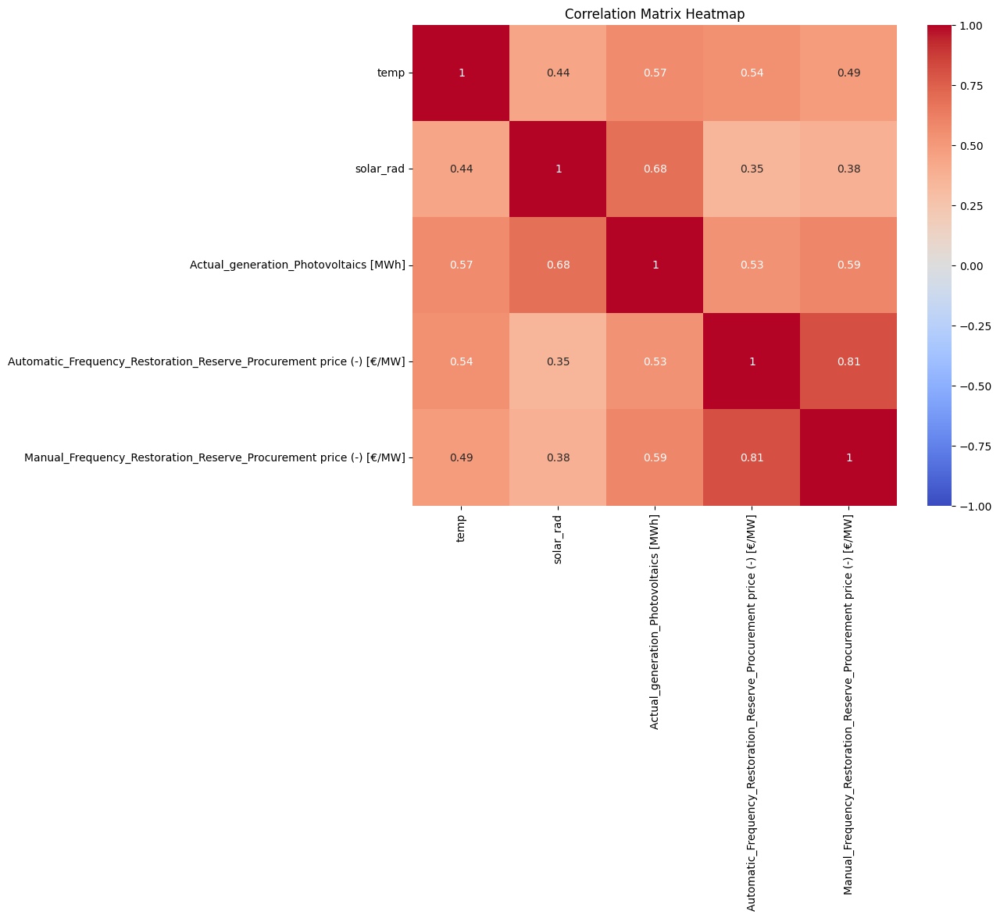

<class 'pandas.core.frame.DataFrame'>
Index: 19052 entries, 2023-01-01 01:00:00 to 2025-03-05 00:00:00
Data columns (total 5 columns):
 #   Column                                                                Non-Null Count  Dtype  
---  ------                                                                --------------  -----  
 0   temp                                                                  19052 non-null  float64
 1   solar_rad                                                             12678 non-null  float64
 2   Actual_generation_Photovoltaics [MWh]                                 19052 non-null  float64
 3   Automatic_Frequency_Restoration_Reserve_Procurement price (-) [€/MW]  4342 non-null   float64
 4   Manual_Frequency_Restoration_Reserve_Procurement price (-) [€/MW]     4342 non-null   float64
dtypes: float64(5)
memory usage: 893.1+ KB
number of final selected features:  8


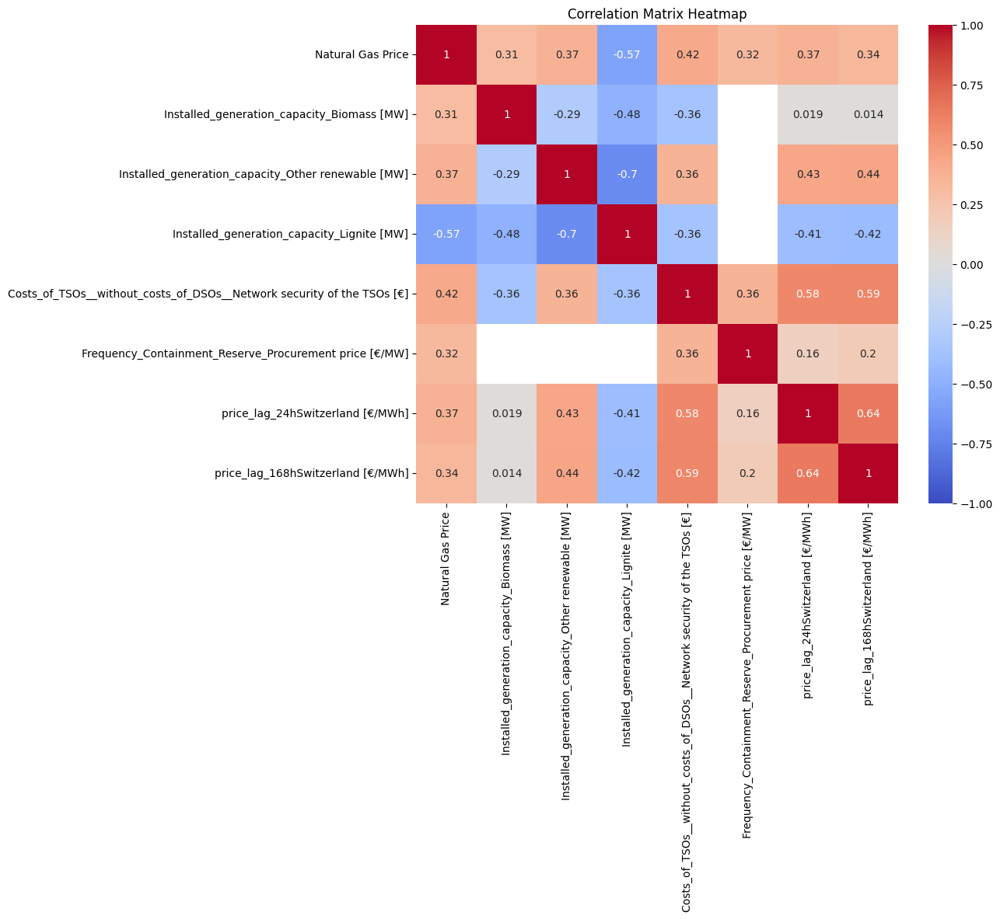

<class 'pandas.core.frame.DataFrame'>
Index: 19052 entries, 2023-01-01 01:00:00 to 2025-03-05 00:00:00
Data columns (total 8 columns):
 #   Column                                                                  Non-Null Count  Dtype  
---  ------                                                                  --------------  -----  
 0   Natural Gas Price                                                       13009 non-null  float64
 1   Installed_generation_capacity_Biomass [MW]                              19052 non-null  float64
 2   Installed_generation_capacity_Other renewable [MW]                      19052 non-null  float64
 3   Installed_generation_capacity_Lignite [MW]                              19052 non-null  float64
 4   Costs_of_TSOs__without_costs_of_DSOs__Network security of the TSOs [€]  17540 non-null  float64
 5   Frequency_Containment_Reserve_Procurement price [€/MW]                  4342 non-null   float64
 6   price_lag_24hSwitzerland [€/MWh]                    

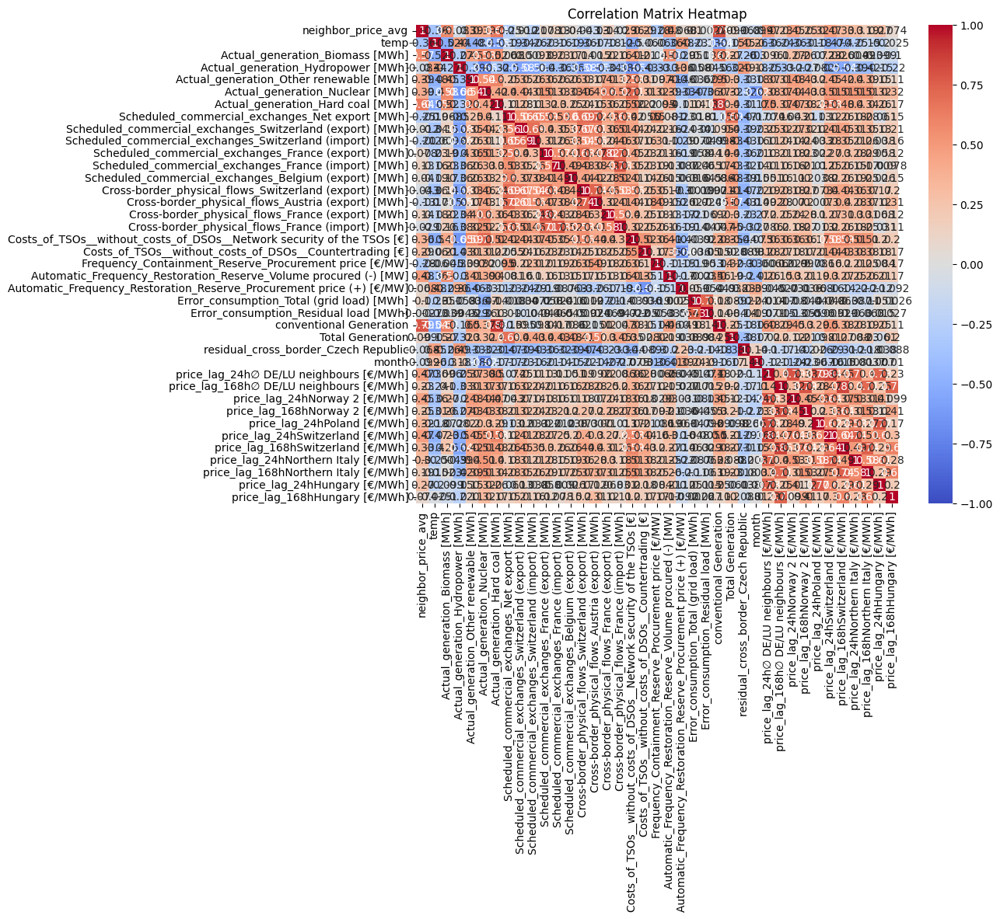

<class 'pandas.core.frame.DataFrame'>
Index: 19052 entries, 2023-01-01 01:00:00 to 2025-03-05 00:00:00
Data columns (total 39 columns):
 #   Column                                                                  Non-Null Count  Dtype  
---  ------                                                                  --------------  -----  
 0   neighbor_price_avg                                                      19052 non-null  float64
 1   temp                                                                    19052 non-null  float64
 2   Actual_generation_Biomass [MWh]                                         19052 non-null  float64
 3   Actual_generation_Hydropower [MWh]                                      19052 non-null  float64
 4   Actual_generation_Other renewable [MWh]                                 19052 non-null  float64
 5   Actual_generation_Nuclear [MWh]                                         9466 non-null   float64
 6   Actual_generation_Hard coal [MWh]                  

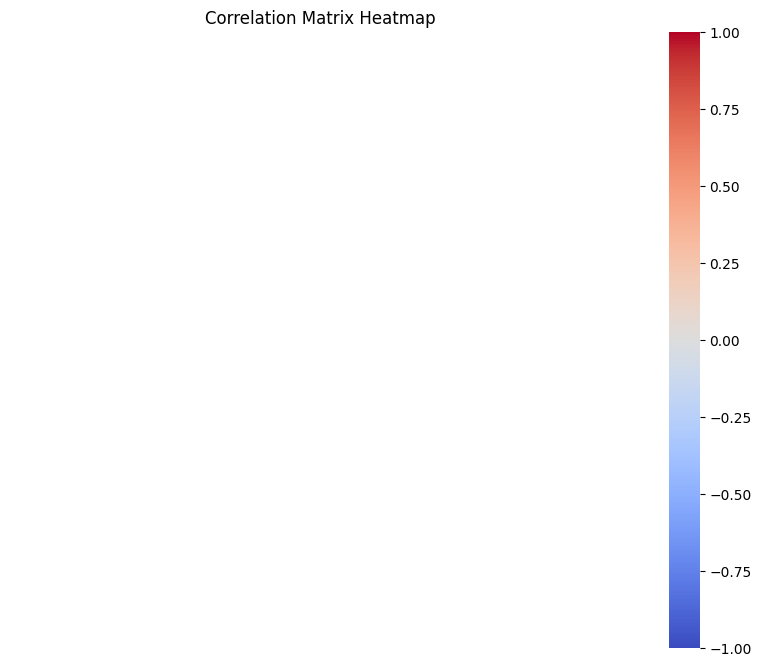

<class 'pandas.core.frame.DataFrame'>
Index: 19052 entries, 2023-01-01 01:00:00 to 2025-03-05 00:00:00
Empty DataFrame
number of final selected features:  10


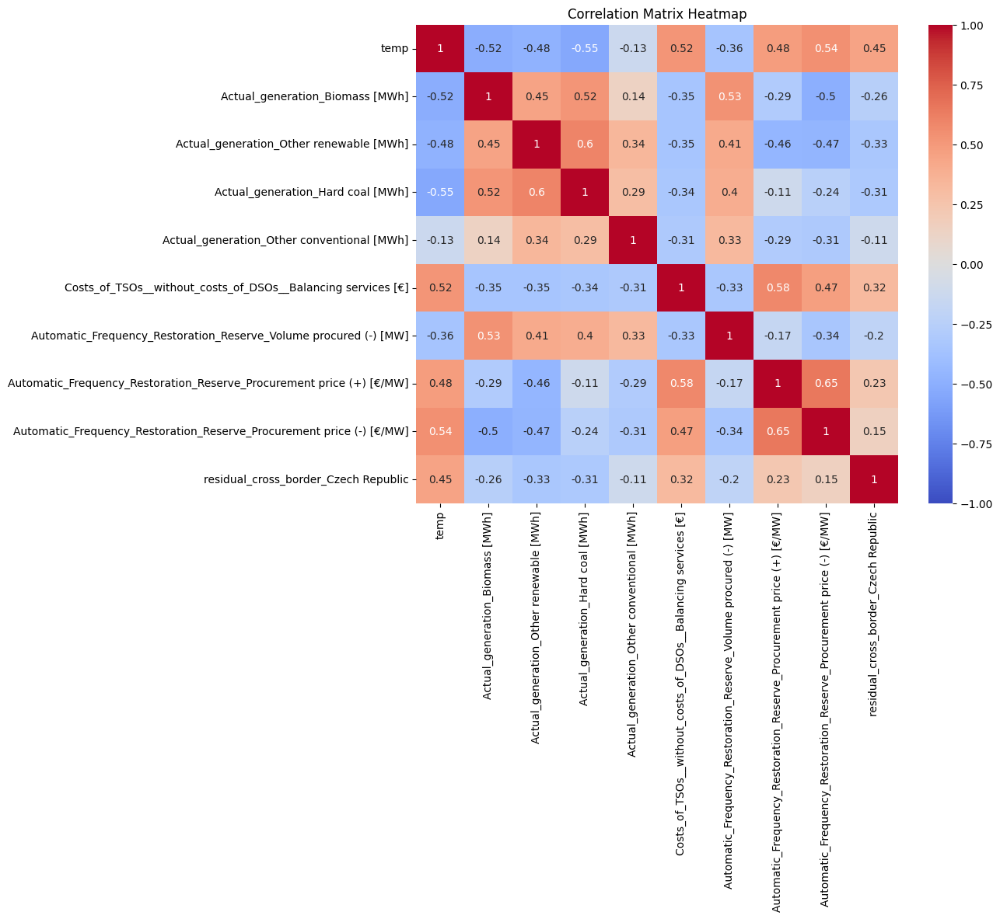

<class 'pandas.core.frame.DataFrame'>
Index: 19052 entries, 2023-01-01 01:00:00 to 2025-03-05 00:00:00
Data columns (total 10 columns):
 #   Column                                                                Non-Null Count  Dtype  
---  ------                                                                --------------  -----  
 0   temp                                                                  19052 non-null  float64
 1   Actual_generation_Biomass [MWh]                                       19052 non-null  float64
 2   Actual_generation_Other renewable [MWh]                               19052 non-null  float64
 3   Actual_generation_Hard coal [MWh]                                     19052 non-null  float64
 4   Actual_generation_Other conventional [MWh]                            19052 non-null  float64
 5   Costs_of_TSOs__without_costs_of_DSOs__Balancing services [€]          17540 non-null  float64
 6   Automatic_Frequency_Restoration_Reserve_Volume procured (-) [MW]   

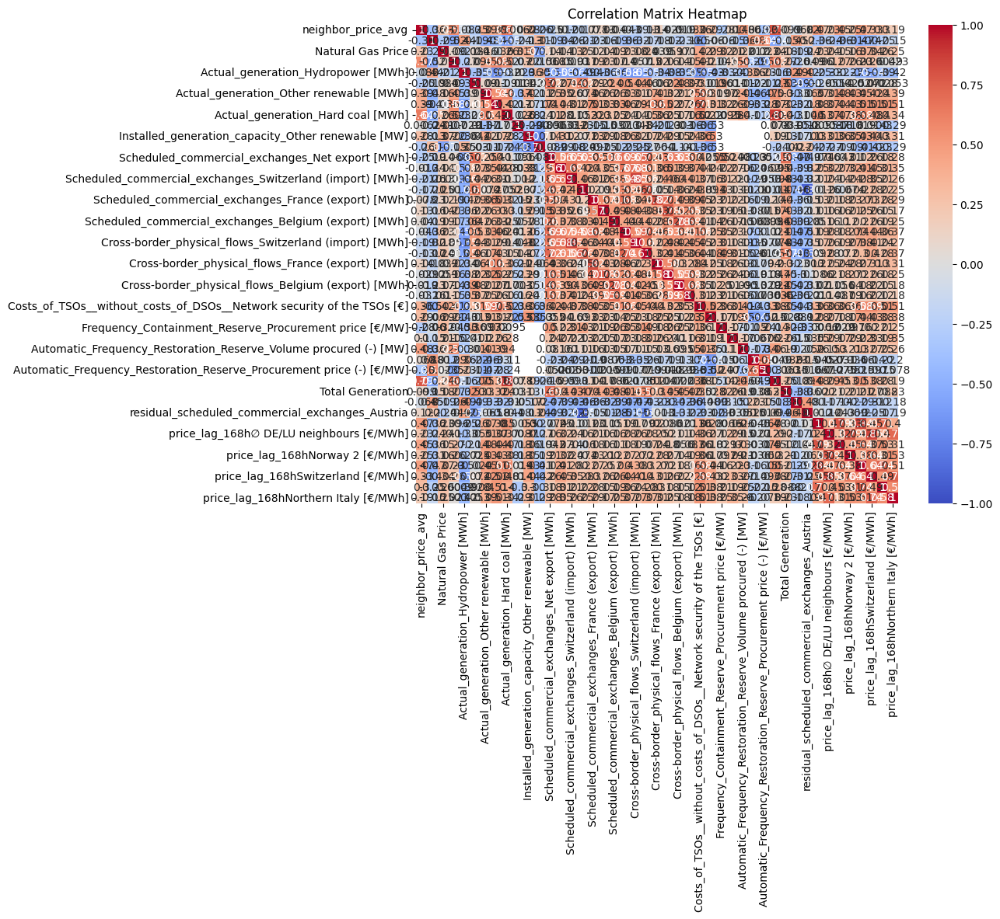

<class 'pandas.core.frame.DataFrame'>
Index: 19052 entries, 2023-01-01 01:00:00 to 2025-03-05 00:00:00
Data columns (total 45 columns):
 #   Column                                                                  Non-Null Count  Dtype  
---  ------                                                                  --------------  -----  
 0   neighbor_price_avg                                                      19052 non-null  float64
 1   temp                                                                    19052 non-null  float64
 2   Natural Gas Price                                                       13009 non-null  float64
 3   Actual_generation_Biomass [MWh]                                         19052 non-null  float64
 4   Actual_generation_Hydropower [MWh]                                      19052 non-null  float64
 5   Actual_generation_Wind onshore [MWh]                                    19052 non-null  float64
 6   Actual_generation_Other renewable [MWh]            

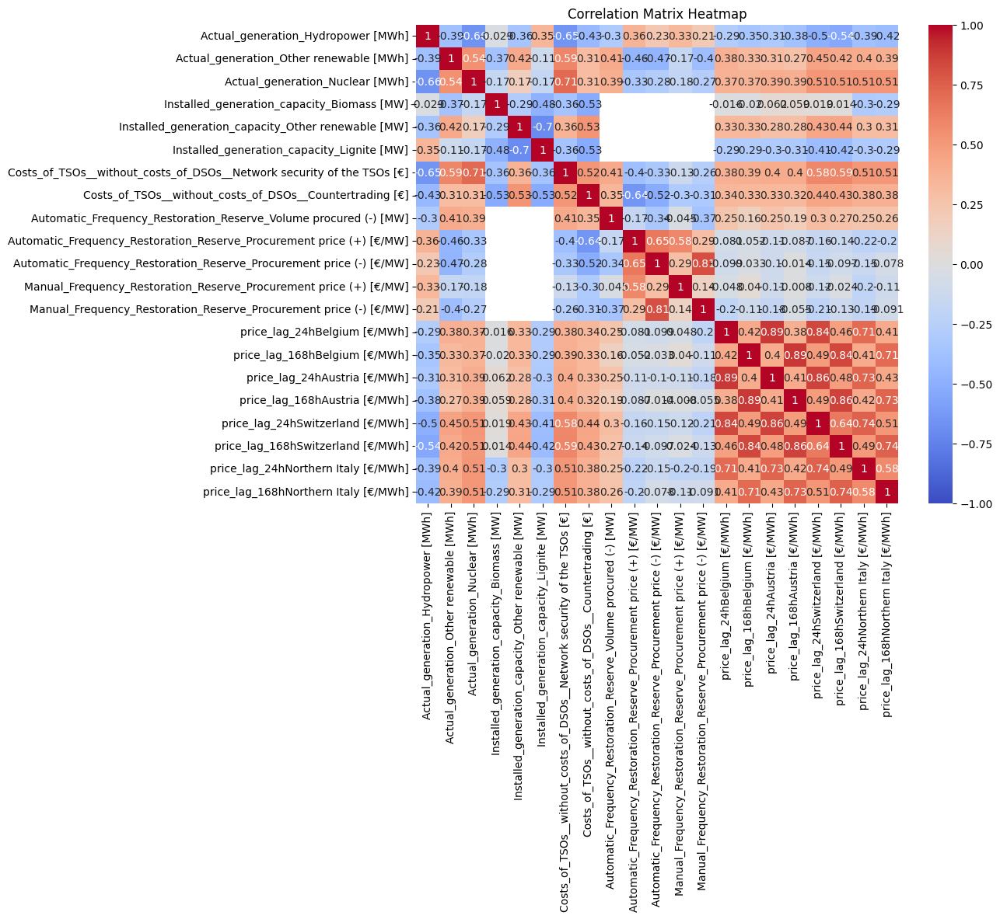

<class 'pandas.core.frame.DataFrame'>
Index: 19052 entries, 2023-01-01 01:00:00 to 2025-03-05 00:00:00
Data columns (total 21 columns):
 #   Column                                                                  Non-Null Count  Dtype  
---  ------                                                                  --------------  -----  
 0   Actual_generation_Hydropower [MWh]                                      19052 non-null  float64
 1   Actual_generation_Other renewable [MWh]                                 19052 non-null  float64
 2   Actual_generation_Nuclear [MWh]                                         9466 non-null   float64
 3   Installed_generation_capacity_Biomass [MW]                              19052 non-null  float64
 4   Installed_generation_capacity_Other renewable [MW]                      19052 non-null  float64
 5   Installed_generation_capacity_Lignite [MW]                              19052 non-null  float64
 6   Costs_of_TSOs__without_costs_of_DSOs__Network secur

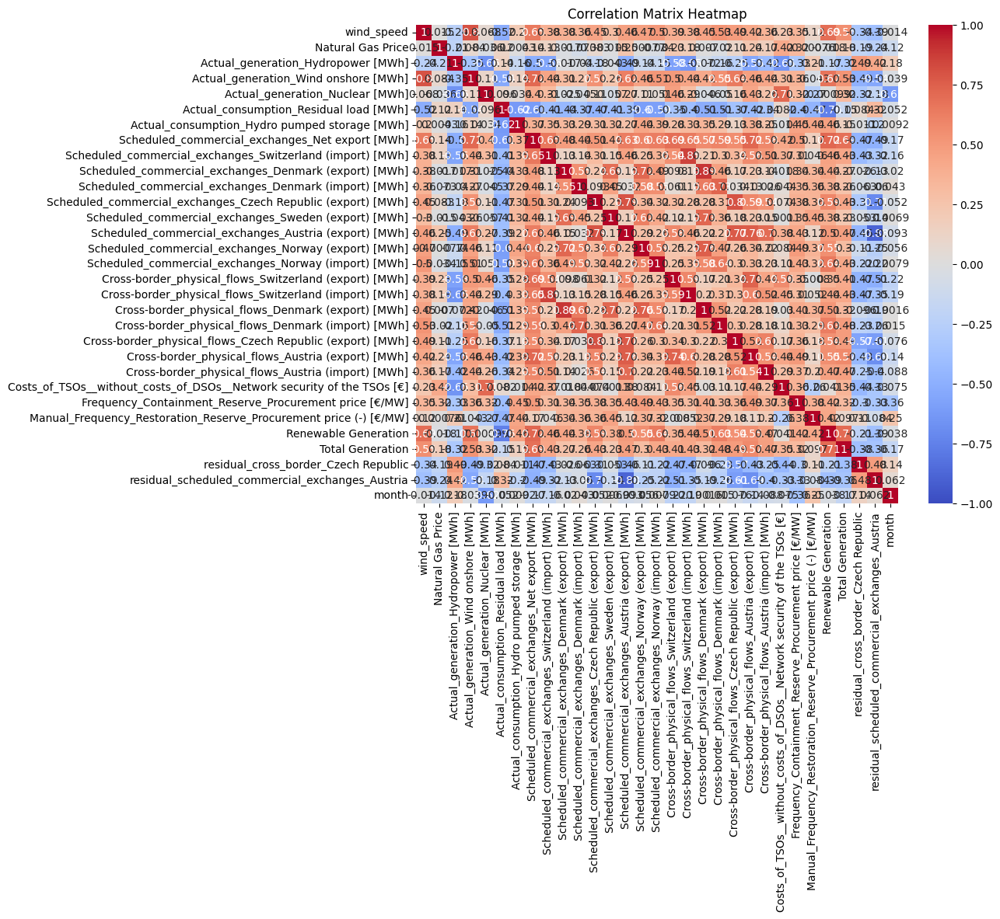

<class 'pandas.core.frame.DataFrame'>
Index: 19052 entries, 2023-01-01 01:00:00 to 2025-03-05 00:00:00
Data columns (total 31 columns):
 #   Column                                                                  Non-Null Count  Dtype  
---  ------                                                                  --------------  -----  
 0   wind_speed                                                              19052 non-null  float64
 1   Natural Gas Price                                                       13009 non-null  float64
 2   Actual_generation_Hydropower [MWh]                                      19052 non-null  float64
 3   Actual_generation_Wind onshore [MWh]                                    19052 non-null  float64
 4   Actual_generation_Nuclear [MWh]                                         9466 non-null   float64
 5   Actual_consumption_Residual load [MWh]                                  19052 non-null  float64
 6   Actual_consumption_Hydro pumped storage [MWh]      

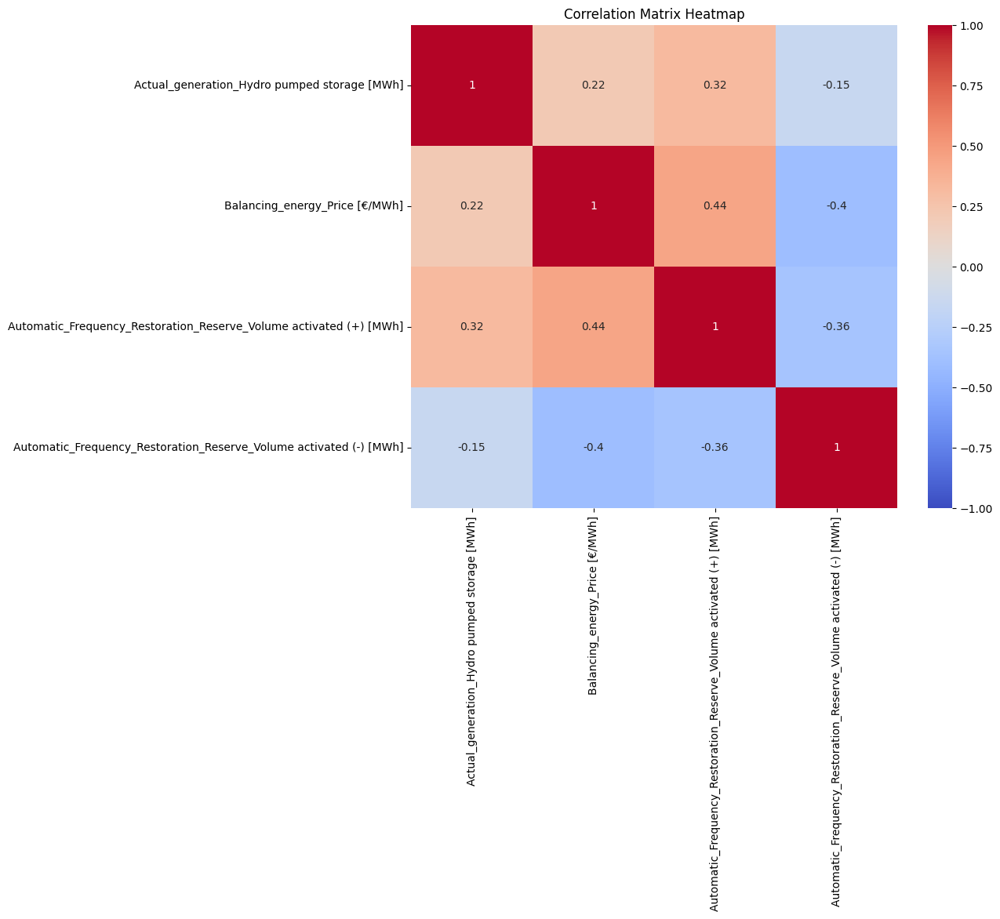

<class 'pandas.core.frame.DataFrame'>
Index: 19052 entries, 2023-01-01 01:00:00 to 2025-03-05 00:00:00
Data columns (total 4 columns):
 #   Column                                                              Non-Null Count  Dtype  
---  ------                                                              --------------  -----  
 0   Actual_generation_Hydro pumped storage [MWh]                        19052 non-null  float64
 1   Balancing_energy_Price [€/MWh]                                      19052 non-null  float64
 2   Automatic_Frequency_Restoration_Reserve_Volume activated (+) [MWh]  7501 non-null   float64
 3   Automatic_Frequency_Restoration_Reserve_Volume activated (-) [MWh]  7501 non-null   float64
dtypes: float64(4)
memory usage: 744.2+ KB
number of final selected features:  3


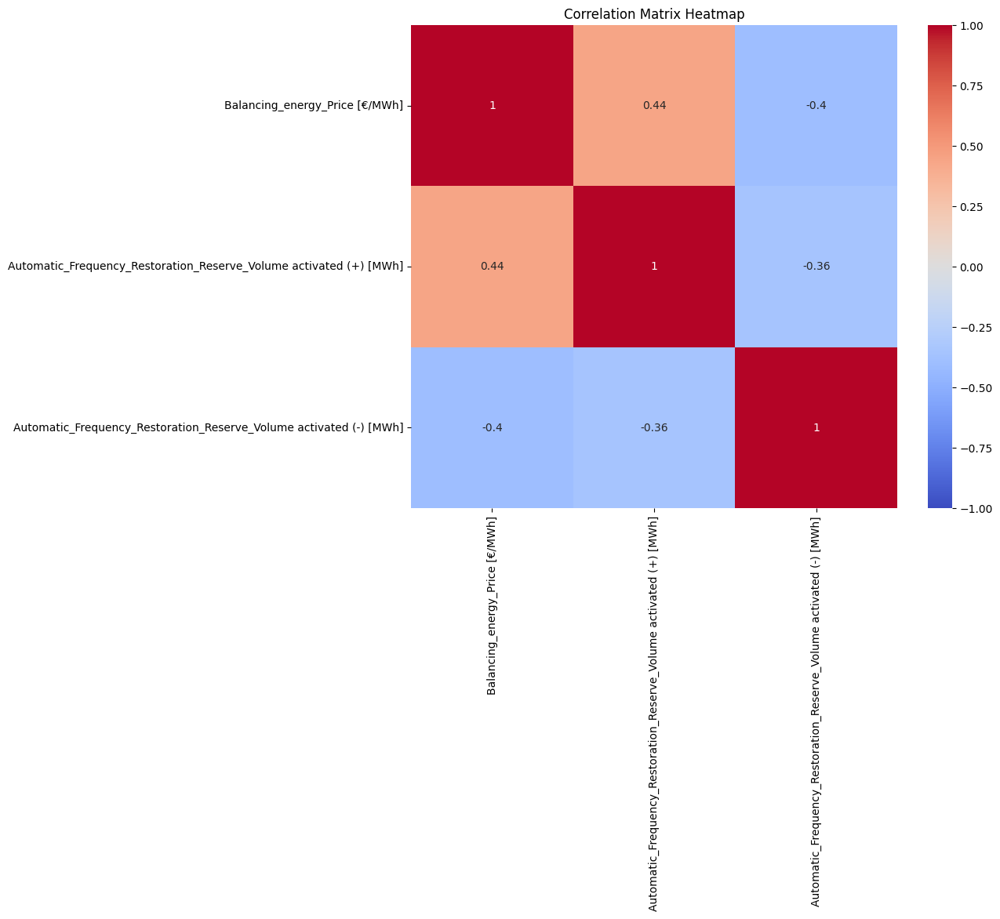

<class 'pandas.core.frame.DataFrame'>
Index: 19052 entries, 2023-01-01 01:00:00 to 2025-03-05 00:00:00
Data columns (total 3 columns):
 #   Column                                                              Non-Null Count  Dtype  
---  ------                                                              --------------  -----  
 0   Balancing_energy_Price [€/MWh]                                      19052 non-null  float64
 1   Automatic_Frequency_Restoration_Reserve_Volume activated (+) [MWh]  7501 non-null   float64
 2   Automatic_Frequency_Restoration_Reserve_Volume activated (-) [MWh]  7501 non-null   float64
dtypes: float64(3)
memory usage: 595.4+ KB
number of final selected features:  9


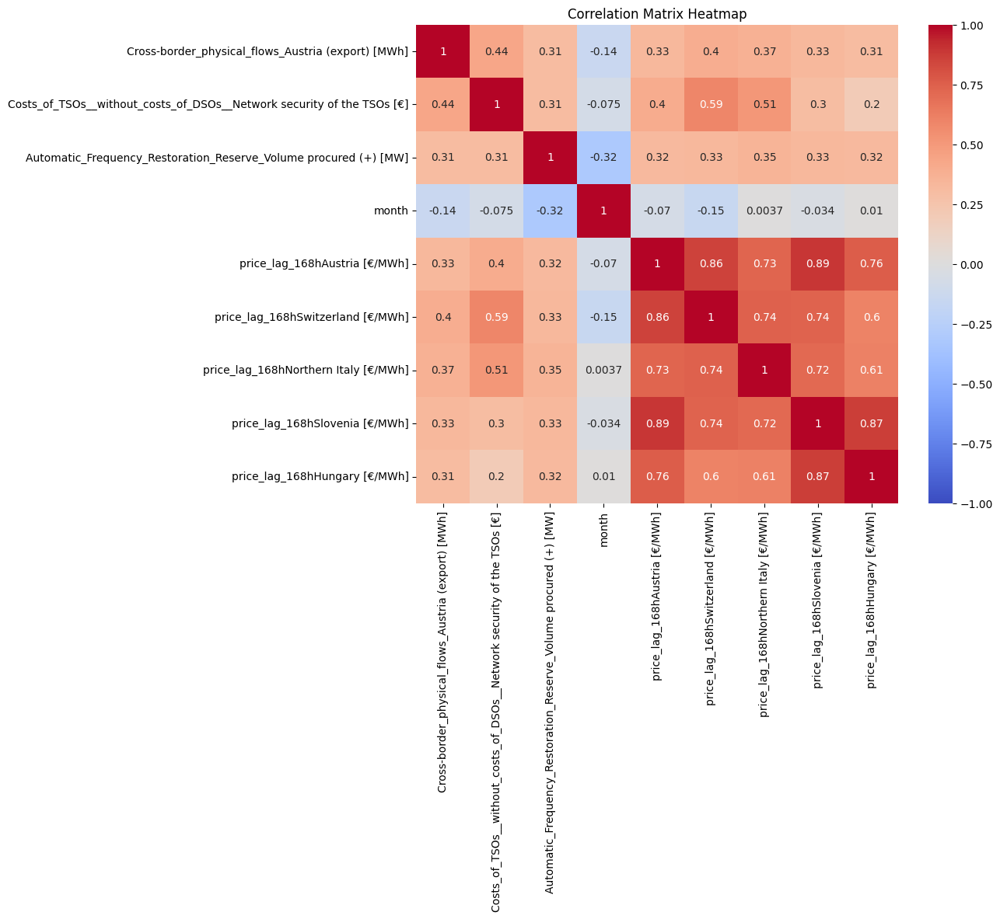

<class 'pandas.core.frame.DataFrame'>
Index: 19052 entries, 2023-01-01 01:00:00 to 2025-03-05 00:00:00
Data columns (total 9 columns):
 #   Column                                                                  Non-Null Count  Dtype  
---  ------                                                                  --------------  -----  
 0   Cross-border_physical_flows_Austria (export) [MWh]                      19052 non-null  float64
 1   Costs_of_TSOs__without_costs_of_DSOs__Network security of the TSOs [€]  17540 non-null  float64
 2   Automatic_Frequency_Restoration_Reserve_Volume procured (+) [MW]        4342 non-null   float64
 3   month                                                                   19052 non-null  float64
 4   price_lag_168hAustria [€/MWh]                                           19052 non-null  float64
 5   price_lag_168hSwitzerland [€/MWh]                                       19052 non-null  float64
 6   price_lag_168hNorthern Italy [€/MWh]                

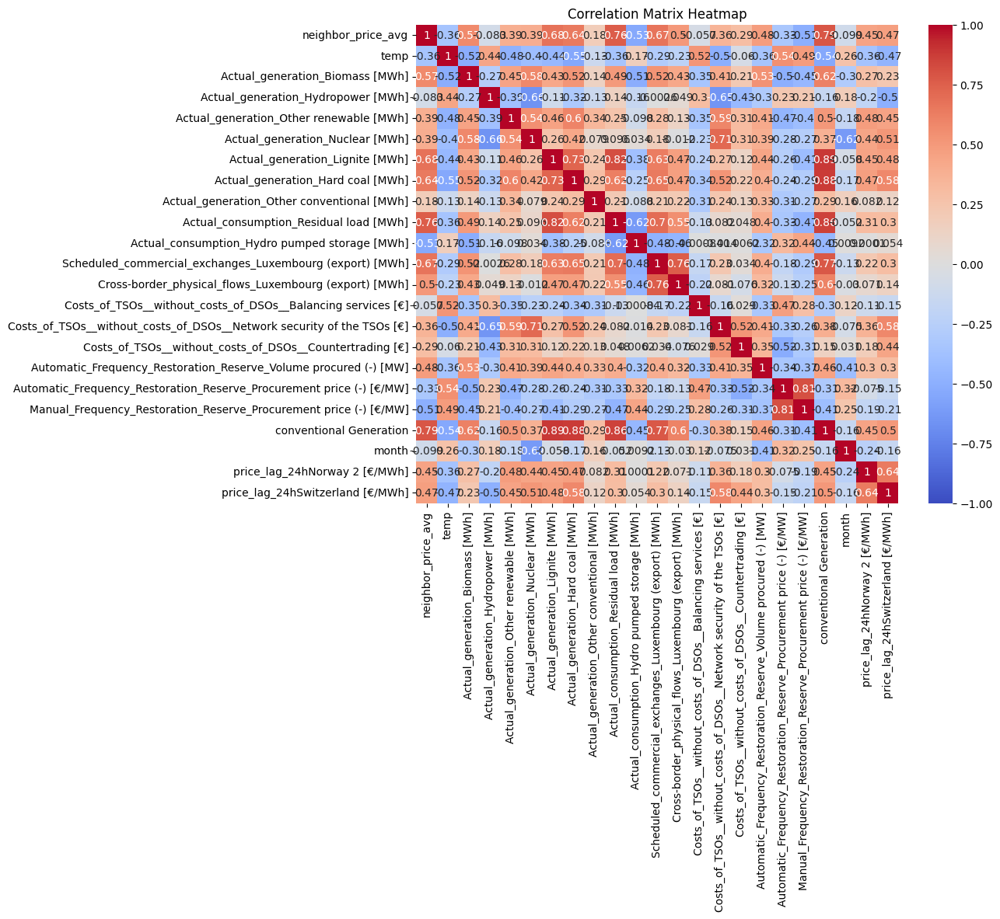

<class 'pandas.core.frame.DataFrame'>
Index: 19052 entries, 2023-01-01 01:00:00 to 2025-03-05 00:00:00
Data columns (total 23 columns):
 #   Column                                                                  Non-Null Count  Dtype  
---  ------                                                                  --------------  -----  
 0   neighbor_price_avg                                                      19052 non-null  float64
 1   temp                                                                    19052 non-null  float64
 2   Actual_generation_Biomass [MWh]                                         19052 non-null  float64
 3   Actual_generation_Hydropower [MWh]                                      19052 non-null  float64
 4   Actual_generation_Other renewable [MWh]                                 19052 non-null  float64
 5   Actual_generation_Nuclear [MWh]                                         9466 non-null   float64
 6   Actual_generation_Lignite [MWh]                    

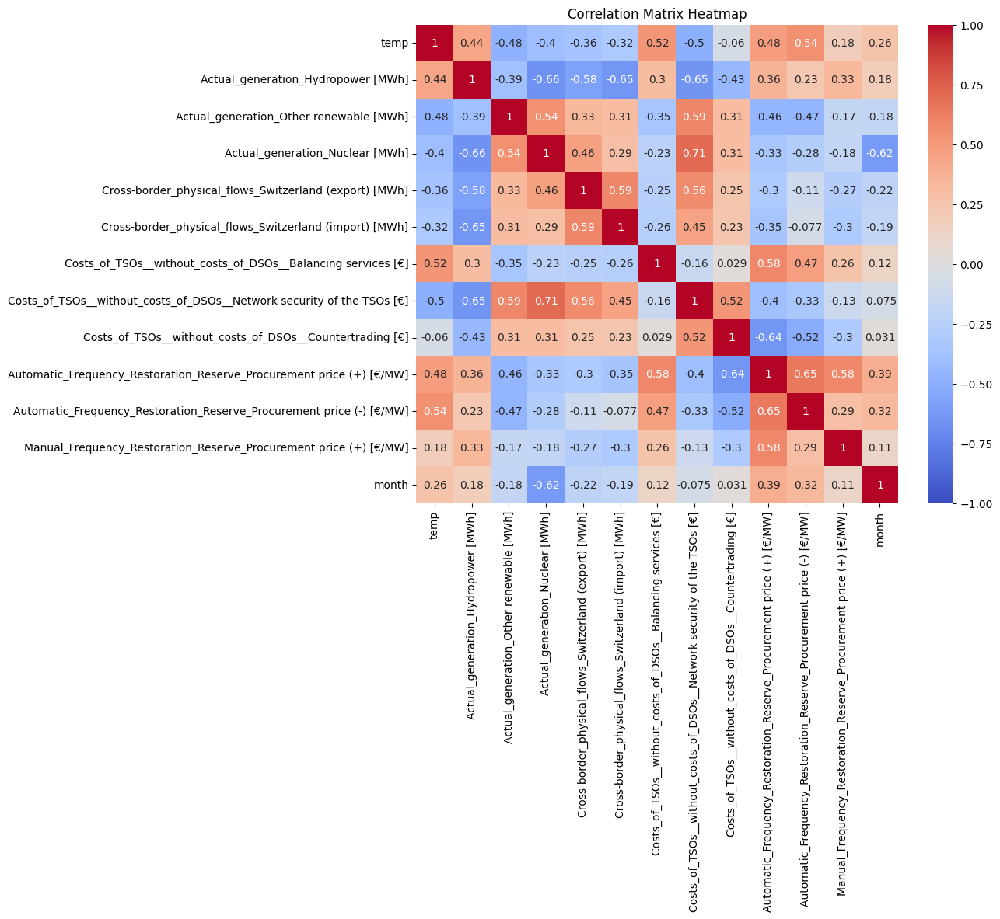

<class 'pandas.core.frame.DataFrame'>
Index: 19052 entries, 2023-01-01 01:00:00 to 2025-03-05 00:00:00
Data columns (total 13 columns):
 #   Column                                                                  Non-Null Count  Dtype  
---  ------                                                                  --------------  -----  
 0   temp                                                                    19052 non-null  float64
 1   Actual_generation_Hydropower [MWh]                                      19052 non-null  float64
 2   Actual_generation_Other renewable [MWh]                                 19052 non-null  float64
 3   Actual_generation_Nuclear [MWh]                                         9466 non-null   float64
 4   Cross-border_physical_flows_Switzerland (export) [MWh]                  19052 non-null  float64
 5   Cross-border_physical_flows_Switzerland (import) [MWh]                  19052 non-null  float64
 6   Costs_of_TSOs__without_costs_of_DSOs__Balancing ser

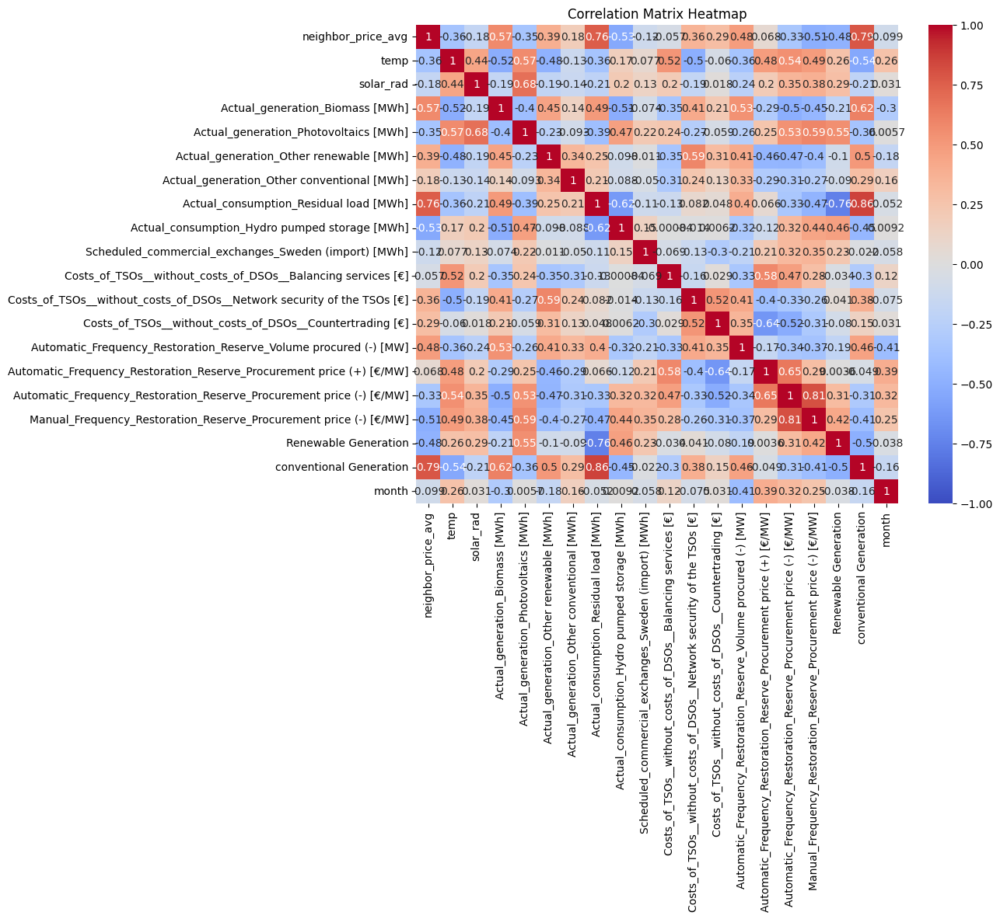

<class 'pandas.core.frame.DataFrame'>
Index: 19052 entries, 2023-01-01 01:00:00 to 2025-03-05 00:00:00
Data columns (total 20 columns):
 #   Column                                                                  Non-Null Count  Dtype  
---  ------                                                                  --------------  -----  
 0   neighbor_price_avg                                                      19052 non-null  float64
 1   temp                                                                    19052 non-null  float64
 2   solar_rad                                                               12678 non-null  float64
 3   Actual_generation_Biomass [MWh]                                         19052 non-null  float64
 4   Actual_generation_Photovoltaics [MWh]                                   19052 non-null  float64
 5   Actual_generation_Other renewable [MWh]                                 19052 non-null  float64
 6   Actual_generation_Other conventional [MWh]         

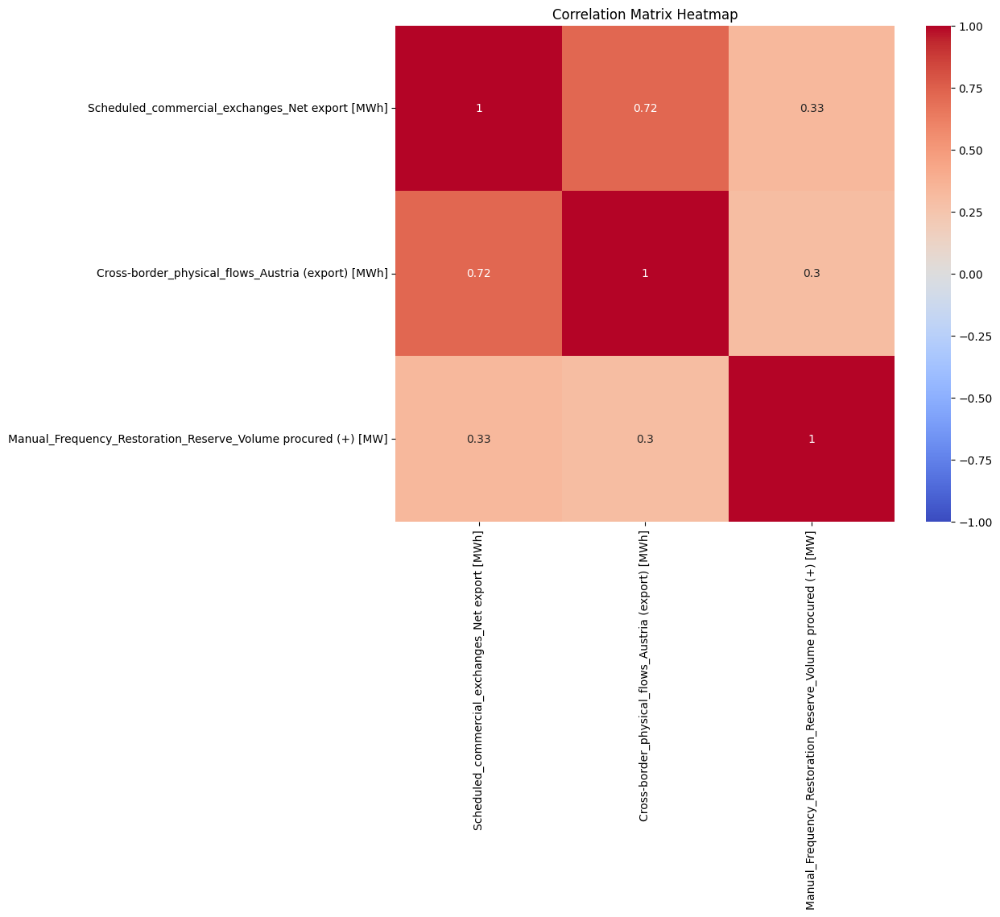

<class 'pandas.core.frame.DataFrame'>
Index: 19052 entries, 2023-01-01 01:00:00 to 2025-03-05 00:00:00
Data columns (total 3 columns):
 #   Column                                                         Non-Null Count  Dtype  
---  ------                                                         --------------  -----  
 0   Scheduled_commercial_exchanges_Net export [MWh]                19052 non-null  float64
 1   Cross-border_physical_flows_Austria (export) [MWh]             19052 non-null  float64
 2   Manual_Frequency_Restoration_Reserve_Volume procured (+) [MW]  4342 non-null   float64
dtypes: float64(3)
memory usage: 595.4+ KB
number of final selected features:  9


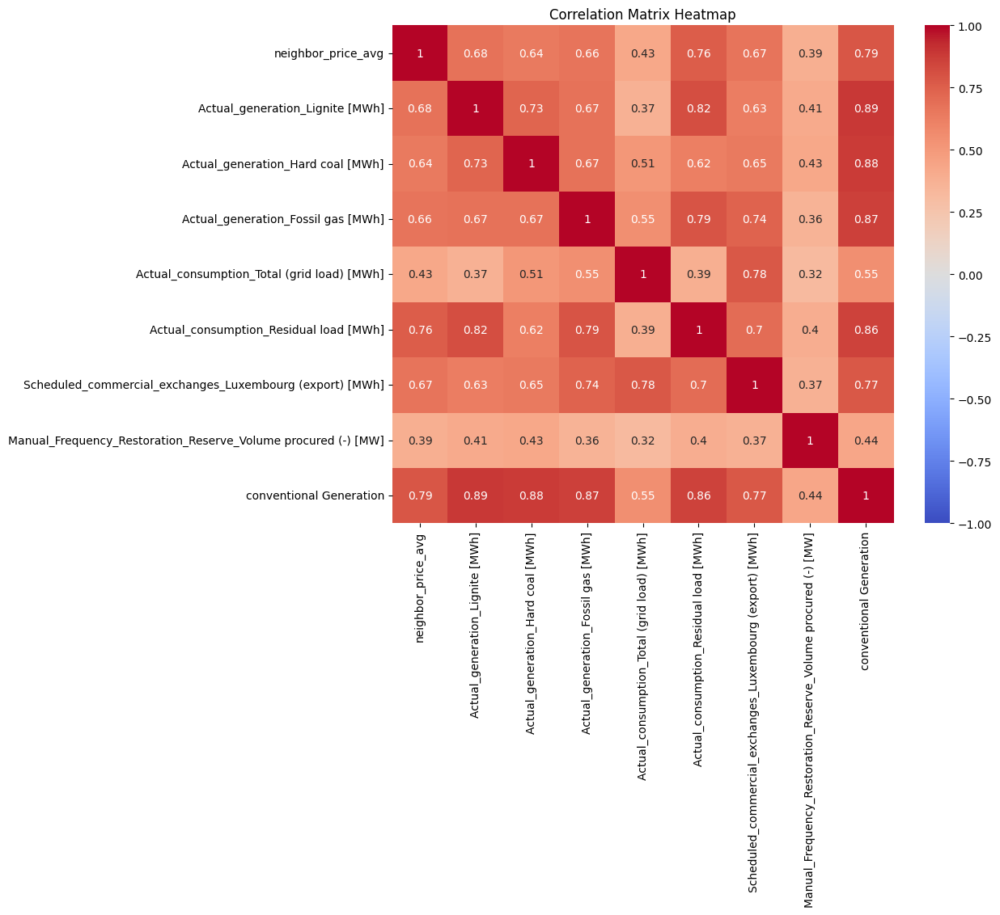

<class 'pandas.core.frame.DataFrame'>
Index: 19052 entries, 2023-01-01 01:00:00 to 2025-03-05 00:00:00
Data columns (total 9 columns):
 #   Column                                                         Non-Null Count  Dtype  
---  ------                                                         --------------  -----  
 0   neighbor_price_avg                                             19052 non-null  float64
 1   Actual_generation_Lignite [MWh]                                19052 non-null  float64
 2   Actual_generation_Hard coal [MWh]                              19052 non-null  float64
 3   Actual_generation_Fossil gas [MWh]                             19052 non-null  float64
 4   Actual_consumption_Total (grid load) [MWh]                     19052 non-null  float64
 5   Actual_consumption_Residual load [MWh]                         19052 non-null  float64
 6   Scheduled_commercial_exchanges_Luxembourg (export) [MWh]       19052 non-null  float64
 7   Manual_Frequency_Restoration_Res

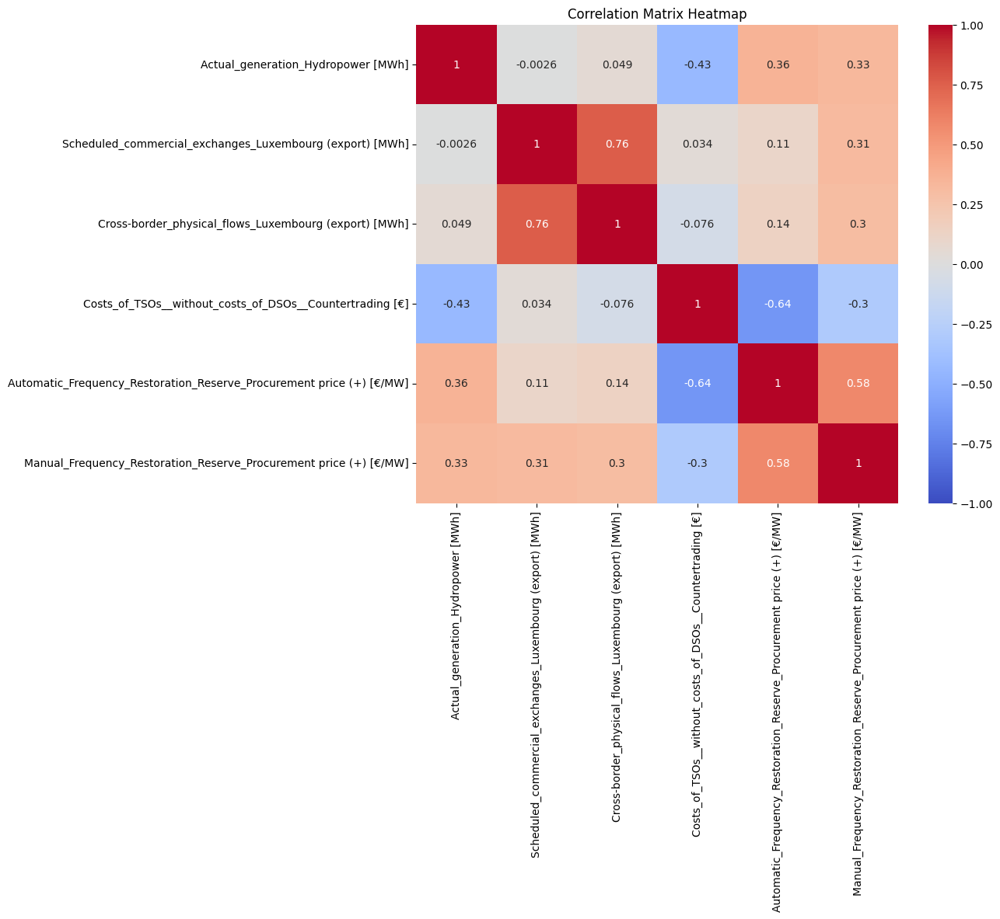

<class 'pandas.core.frame.DataFrame'>
Index: 19052 entries, 2023-01-01 01:00:00 to 2025-03-05 00:00:00
Data columns (total 6 columns):
 #   Column                                                                Non-Null Count  Dtype  
---  ------                                                                --------------  -----  
 0   Actual_generation_Hydropower [MWh]                                    19052 non-null  float64
 1   Scheduled_commercial_exchanges_Luxembourg (export) [MWh]              19052 non-null  float64
 2   Cross-border_physical_flows_Luxembourg (export) [MWh]                 19052 non-null  float64
 3   Costs_of_TSOs__without_costs_of_DSOs__Countertrading [€]              17540 non-null  float64
 4   Automatic_Frequency_Restoration_Reserve_Procurement price (+) [€/MW]  4342 non-null   float64
 5   Manual_Frequency_Restoration_Reserve_Procurement price (+) [€/MW]     4342 non-null   float64
dtypes: float64(6)
memory usage: 1.0+ MB
number of final selected feature

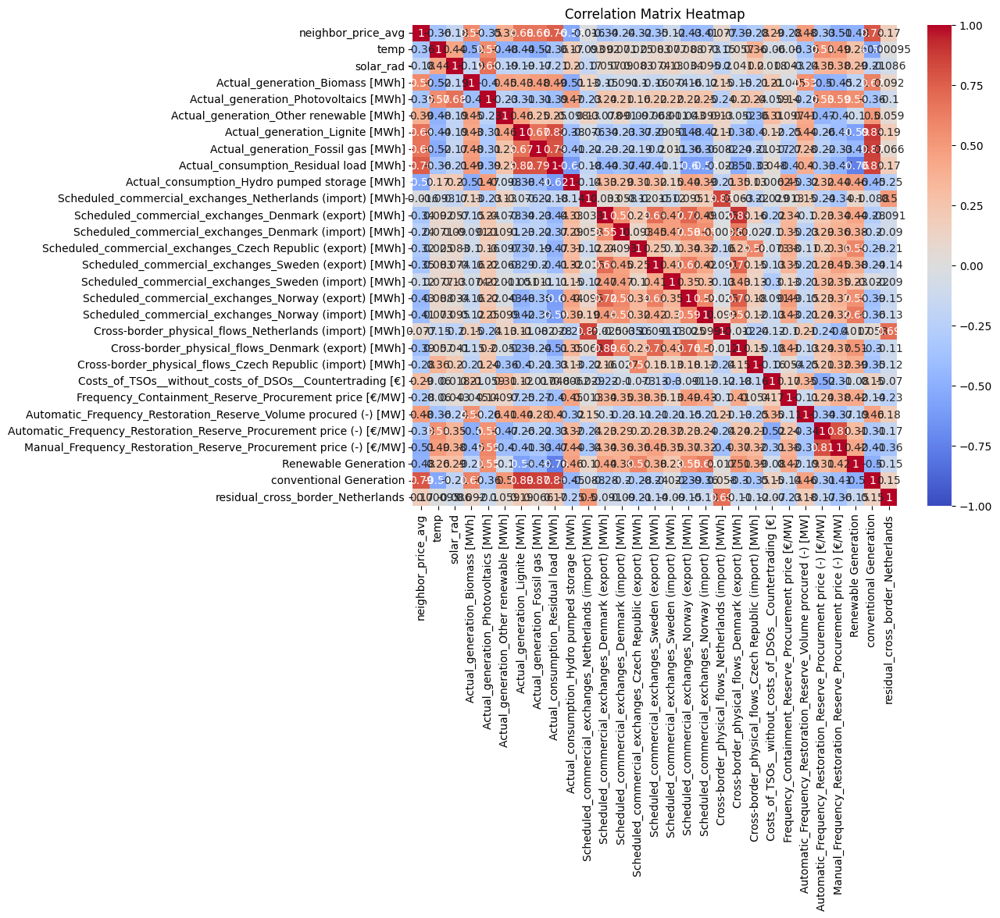

<class 'pandas.core.frame.DataFrame'>
Index: 19052 entries, 2023-01-01 01:00:00 to 2025-03-05 00:00:00
Data columns (total 29 columns):
 #   Column                                                                Non-Null Count  Dtype  
---  ------                                                                --------------  -----  
 0   neighbor_price_avg                                                    19052 non-null  float64
 1   temp                                                                  19052 non-null  float64
 2   solar_rad                                                             12678 non-null  float64
 3   Actual_generation_Biomass [MWh]                                       19052 non-null  float64
 4   Actual_generation_Photovoltaics [MWh]                                 19052 non-null  float64
 5   Actual_generation_Other renewable [MWh]                               19052 non-null  float64
 6   Actual_generation_Lignite [MWh]                                    

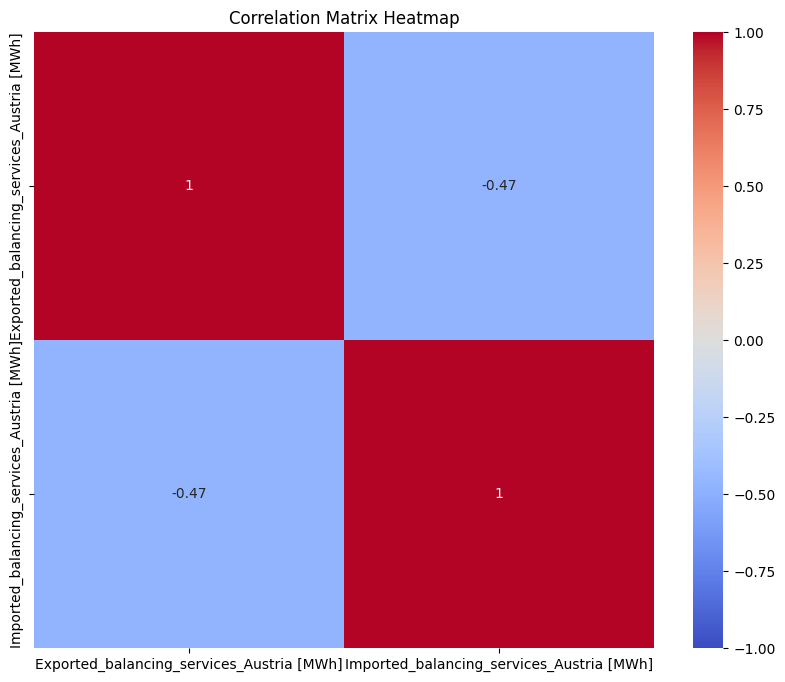

<class 'pandas.core.frame.DataFrame'>
Index: 19052 entries, 2023-01-01 01:00:00 to 2025-03-05 00:00:00
Data columns (total 2 columns):
 #   Column                                     Non-Null Count  Dtype  
---  ------                                     --------------  -----  
 0   Exported_balancing_services_Austria [MWh]  8014 non-null   float64
 1   Imported_balancing_services_Austria [MWh]  8014 non-null   float64
dtypes: float64(2)
memory usage: 446.5+ KB
number of final selected features:  2


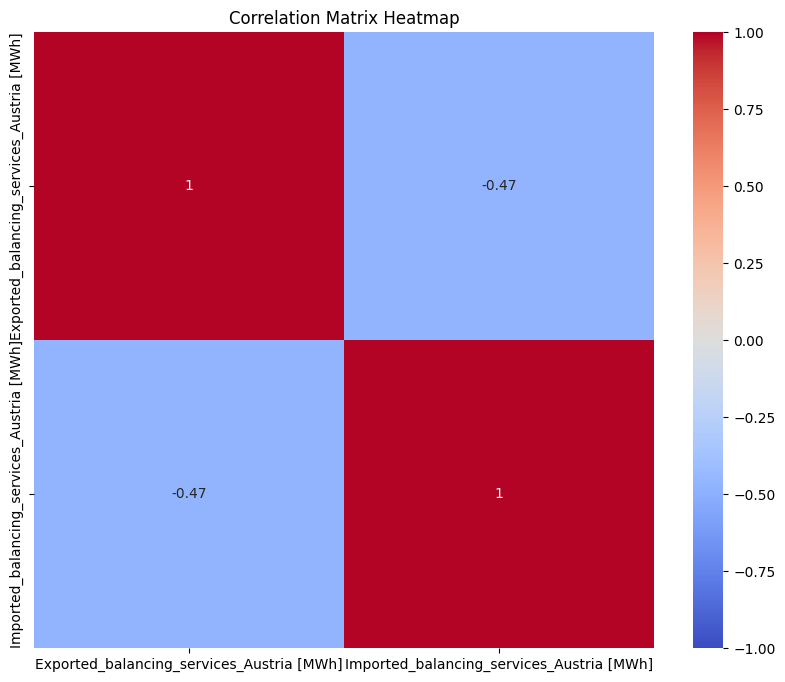

<class 'pandas.core.frame.DataFrame'>
Index: 19052 entries, 2023-01-01 01:00:00 to 2025-03-05 00:00:00
Data columns (total 2 columns):
 #   Column                                     Non-Null Count  Dtype  
---  ------                                     --------------  -----  
 0   Exported_balancing_services_Austria [MWh]  8014 non-null   float64
 1   Imported_balancing_services_Austria [MWh]  8014 non-null   float64
dtypes: float64(2)
memory usage: 446.5+ KB
number of final selected features:  24


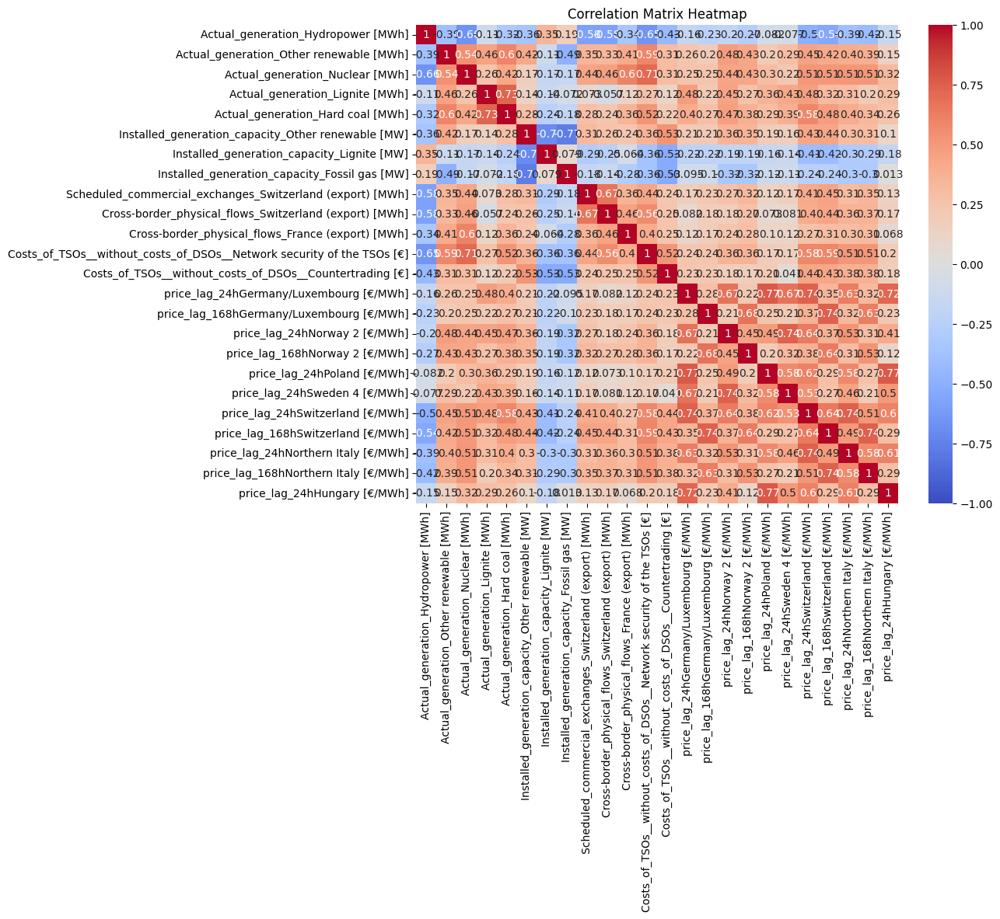

<class 'pandas.core.frame.DataFrame'>
Index: 19052 entries, 2023-01-01 01:00:00 to 2025-03-05 00:00:00
Data columns (total 24 columns):
 #   Column                                                                  Non-Null Count  Dtype  
---  ------                                                                  --------------  -----  
 0   Actual_generation_Hydropower [MWh]                                      19052 non-null  float64
 1   Actual_generation_Other renewable [MWh]                                 19052 non-null  float64
 2   Actual_generation_Nuclear [MWh]                                         9466 non-null   float64
 3   Actual_generation_Lignite [MWh]                                         19052 non-null  float64
 4   Actual_generation_Hard coal [MWh]                                       19052 non-null  float64
 5   Installed_generation_capacity_Other renewable [MW]                      19052 non-null  float64
 6   Installed_generation_capacity_Lignite [MW]         

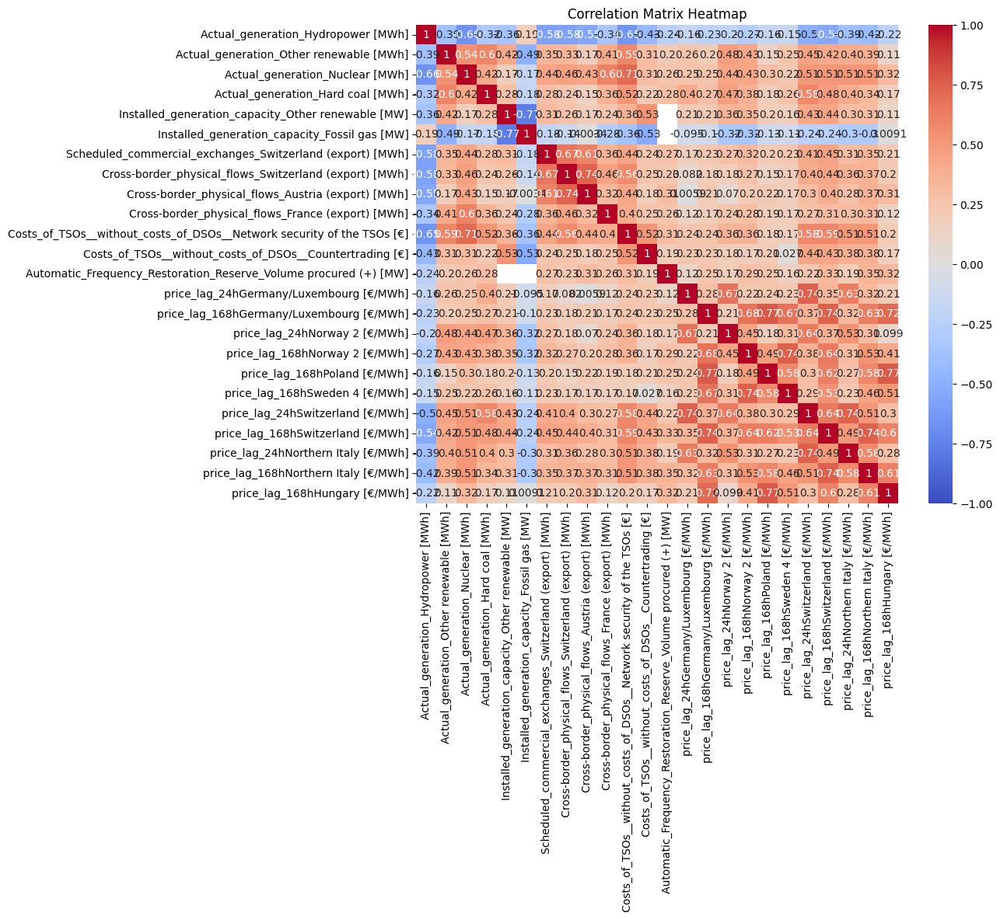

<class 'pandas.core.frame.DataFrame'>
Index: 19052 entries, 2023-01-01 01:00:00 to 2025-03-05 00:00:00
Data columns (total 24 columns):
 #   Column                                                                  Non-Null Count  Dtype  
---  ------                                                                  --------------  -----  
 0   Actual_generation_Hydropower [MWh]                                      19052 non-null  float64
 1   Actual_generation_Other renewable [MWh]                                 19052 non-null  float64
 2   Actual_generation_Nuclear [MWh]                                         9466 non-null   float64
 3   Actual_generation_Hard coal [MWh]                                       19052 non-null  float64
 4   Installed_generation_capacity_Other renewable [MW]                      19052 non-null  float64
 5   Installed_generation_capacity_Fossil gas [MW]                           19052 non-null  float64
 6   Scheduled_commercial_exchanges_Switzerland (export)

In [13]:
features_dict = {}
all_features=[]
for col in missed[(missed['percentage_of_missing_values'] > 0)]['column_name']:
  if 'Day-ahead_prices' not in col:
    features= find_features(df,col)
    features_dict.update({col:features})
    all_features.append(features)

### Transformation

In [8]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

price_cols = [col for col in df.columns if 'day-ahead_prices' in col.lower()]
std_cols = [col for col in df.columns if col not in price_cols]

transformed_df = df.copy()
transformed_df[std_cols] = scaler.fit_transform(transformed_df[std_cols])

for col in std_cols:
    mean = transformed_df[col].mean()
    # Use ddof=0 to match StandardScaler's population std
    std_dev = transformed_df[col].std(ddof=0)
    if abs(mean) < 1e-6 and abs(std_dev - 1) < 1e-3:
        print(f"{col}: Transformed")
    else:
        print(f"{col}: Not Transformed")


neighbor_price_avg: Transformed
temp: Transformed
wind_speed: Transformed
solar_rad: Transformed
Natural Gas Price: Transformed
Actual_generation_Biomass [MWh]: Transformed
Actual_generation_Hydropower [MWh]: Transformed
Actual_generation_Wind offshore [MWh]: Transformed
Actual_generation_Wind onshore [MWh]: Transformed
Actual_generation_Photovoltaics [MWh]: Transformed
Actual_generation_Other renewable [MWh]: Transformed
Actual_generation_Nuclear [MWh]: Transformed
Actual_generation_Lignite [MWh]: Transformed
Actual_generation_Hard coal [MWh]: Transformed
Actual_generation_Fossil gas [MWh]: Transformed
Actual_generation_Hydro pumped storage [MWh]: Transformed
Actual_generation_Other conventional [MWh]: Transformed
Installed_generation_capacity_Biomass [MW]: Transformed
Installed_generation_capacity_Hydropower [MW]: Transformed
Installed_generation_capacity_Wind offshore [MW]: Transformed
Installed_generation_capacity_Wind onshore [MW]: Transformed
Installed_generation_capacity_Photovo

### Imputation

#### RF , XGB

In [14]:
black = '\033[30m'
red = '\033[31m'
green = '\033[32m'
yellow = '\033[33m'
blue = '\033[34m'
magenta = '\033[35m'
cyan = '\033[36m'
white = '\033[37m'
orange = "\033[38;5;208m"
bold = '\033[1m'
reset = '\033[0m'


In [86]:
transformed_df.reset_index(inplace=True)
transformed_df.drop(columns=['End date'], inplace=True)
df.reset_index(inplace=True)
df.drop(columns=['End date'], inplace=True)

 solar_rad
Feature Importances:
                                             feature  importance
1                Actual_generation_Photovoltaics MWh    0.605820
3  Manual_Frequency_Restoration_Reserve_Procureme...    0.149119
0                                               temp    0.125824
2  Automatic_Frequency_Restoration_Reserve_Procur...    0.119237


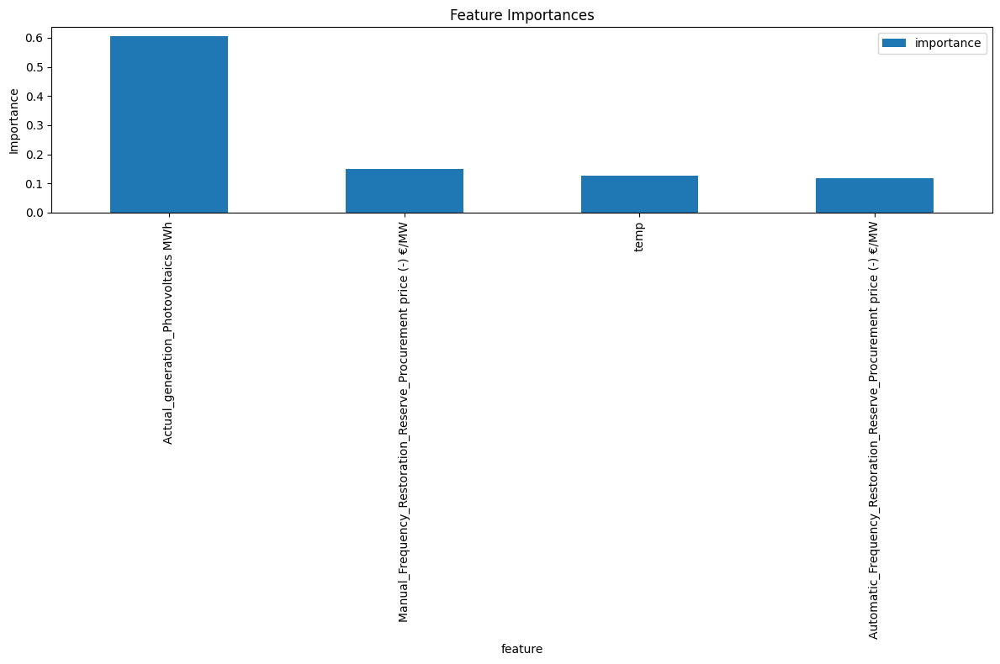

Root Mean Square Error: 14.537475218059386
Mean Squared Error: 211.3381857156908
Mean Absolute Error: 8.244163629667222
R² Score: 0.48639367674899325
 Natural Gas Price
Feature Importances:
                                             feature  importance
3  Costs_of_TSOs__without_costs_of_DSOs__Network ...    0.537489
0           Installed_generation_capacity_Biomass MW    0.167445
1   Installed_generation_capacity_Other renewable MW    0.097673
6                    price_lag_168hSwitzerland €/MWh    0.070150
4  Frequency_Containment_Reserve_Procurement pric...    0.067615
5                     price_lag_24hSwitzerland €/MWh    0.059628
2           Installed_generation_capacity_Lignite MW    0.000000


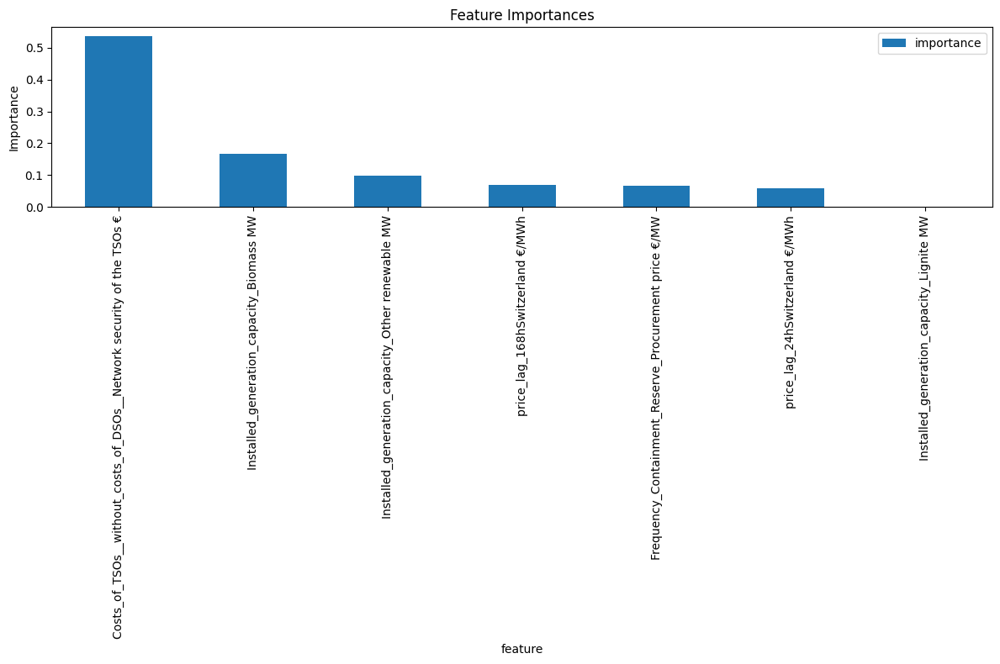

Root Mean Square Error: 0.6219339350435161
Mean Squared Error: 0.38680181955871257
Mean Absolute Error: 0.23155000120378474
R² Score: 0.5120707834789845
-------------------------------- Natural Gas Price
 Actual_generation_Nuclear MWh
Feature Importances:
                                              feature  importance
16  Costs_of_TSOs__without_costs_of_DSOs__Network ...    0.868917
26                                              month    0.078227
3                    Actual_generation_Hydropower MWh    0.014842
2                       Actual_generation_Biomass MWh    0.010404
13   Cross-border_physical_flows_Austria (export) MWh    0.005830
22                Error_consumption_Residual load MWh    0.003792
19  Automatic_Frequency_Restoration_Reserve_Volume...    0.003096
7   Scheduled_commercial_exchanges_Switzerland (ex...    0.002035
5                     Actual_generation_Hard coal MWh    0.001721
15    Cross-border_physical_flows_France (import) MWh    0.001438
1                 

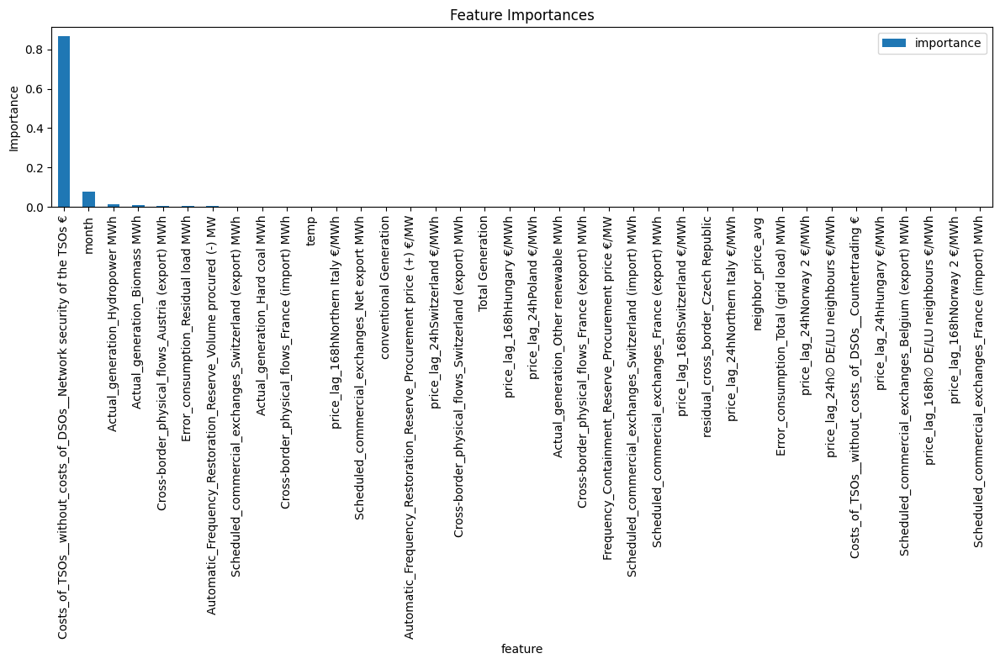

Root Mean Square Error: 33.14236346330506
Mean Squared Error: 1098.4162559338183
Mean Absolute Error: 9.410435404421992
R² Score: 0.9875956888521243
 Costs_of_TSOs__without_costs_of_DSOs__Balancing services €
Feature Importances:
                                             feature  importance
0                                               temp    0.265990
4           Actual_generation_Other conventional MWh    0.147044
2              Actual_generation_Other renewable MWh    0.136103
5  Automatic_Frequency_Restoration_Reserve_Volume...    0.125424
6  Automatic_Frequency_Restoration_Reserve_Procur...    0.091261
3                    Actual_generation_Hard coal MWh    0.086669
1                      Actual_generation_Biomass MWh    0.064534
8               residual_cross_border_Czech Republic    0.056661
7  Automatic_Frequency_Restoration_Reserve_Procur...    0.026314


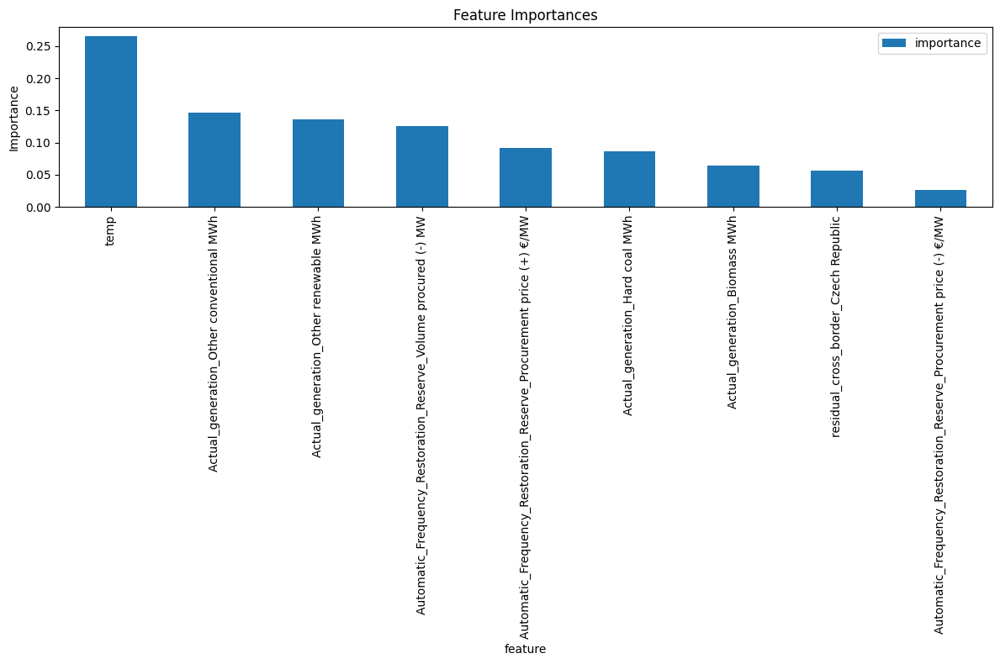

Root Mean Square Error: 15807830.7400537
Mean Squared Error: 249887512706186.72
Mean Absolute Error: 10143102.20750214
R² Score: 0.7644039292981242
 Costs_of_TSOs__without_costs_of_DSOs__Network security of the TSOs €
Feature Importances:
                                              feature  importance
4                    Actual_generation_Hydropower MWh    0.363968
7                       Actual_generation_Nuclear MWh    0.181683
26  Costs_of_TSOs__without_costs_of_DSOs__Countert...    0.117625
29  Automatic_Frequency_Restoration_Reserve_Volume...    0.046403
6               Actual_generation_Other renewable MWh    0.044411
18  Scheduled_commercial_exchanges_Belgium (export...    0.031096
27  Frequency_Containment_Reserve_Procurement pric...    0.027403
8                     Actual_generation_Hard coal MWh    0.025945
2                                   Natural Gas Price    0.025773
41                    price_lag_168hSwitzerland €/MWh    0.016069
30  Automatic_Frequency_Restoration

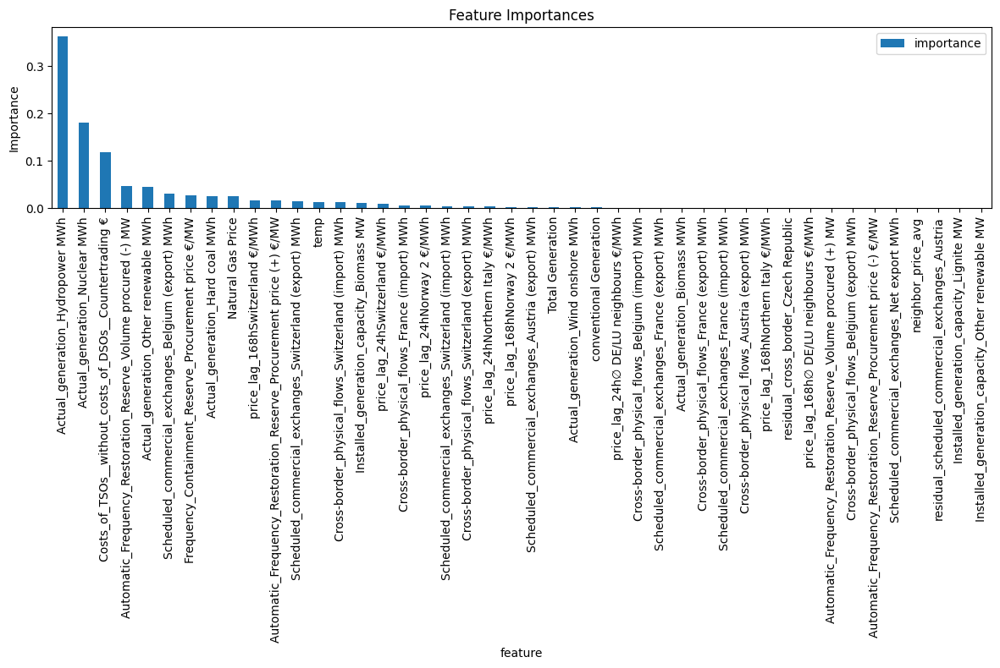

Root Mean Square Error: 7034516.71308156
Mean Squared Error: 49484425386623.8
Mean Absolute Error: 4284827.586956243
R² Score: 0.9941040047159113
 Costs_of_TSOs__without_costs_of_DSOs__Countertrading €
Feature Importances:
                                              feature    importance
3            Installed_generation_capacity_Biomass MW  4.763229e-01
6   Costs_of_TSOs__without_costs_of_DSOs__Network ...  3.374001e-01
7   Automatic_Frequency_Restoration_Reserve_Volume...  1.421707e-01
2                       Actual_generation_Nuclear MWh  4.041713e-02
0                    Actual_generation_Hydropower MWh  1.856670e-03
1               Actual_generation_Other renewable MWh  1.002961e-03
19                 price_lag_168hNorthern Italy €/MWh  6.950290e-04
18                  price_lag_24hNorthern Italy €/MWh  4.509214e-05
17                    price_lag_168hSwitzerland €/MWh  3.537361e-05
14                         price_lag_24hAustria €/MWh  2.481564e-05
16                     price_

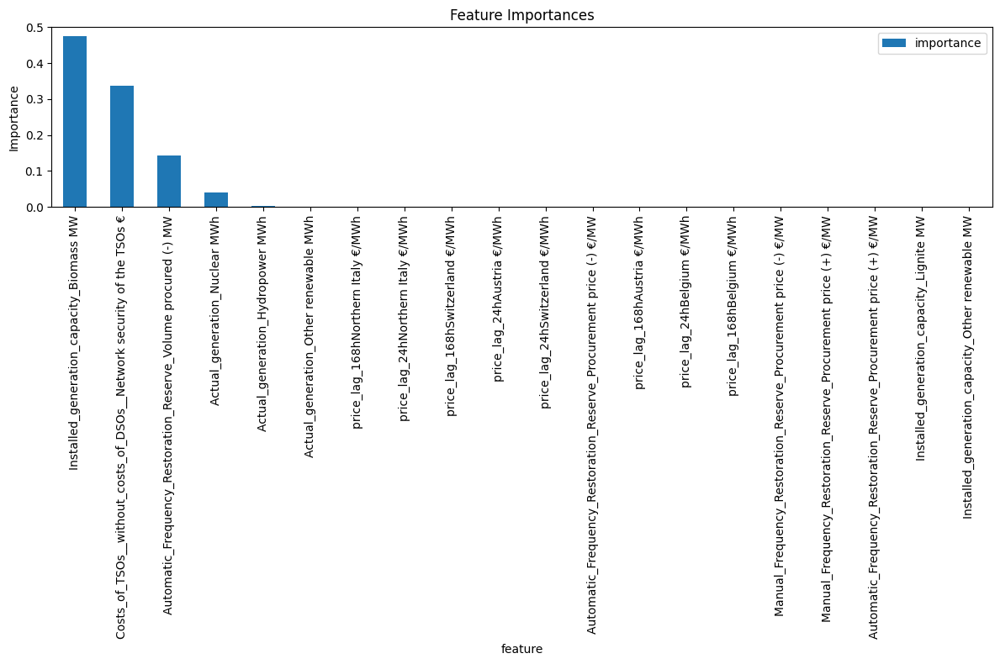

Root Mean Square Error: 59023.20674132531
Mean Squared Error: 3483738934.0292296
Mean Absolute Error: 14958.940223774218
R² Score: 0.9999229445878695
 Frequency_Containment_Reserve_Procurement price €/MW
Feature Importances:
                                              feature  importance
23  Costs_of_TSOs__without_costs_of_DSOs__Network ...    0.328431
14  Scheduled_commercial_exchanges_Norway (export)...    0.197202
5                Actual_consumption_Residual load MWh    0.076326
24  Manual_Frequency_Restoration_Reserve_Procureme...    0.074387
25                               Renewable Generation    0.033464
1                                   Natural Gas Price    0.028266
4                       Actual_generation_Nuclear MWh    0.025533
13  Scheduled_commercial_exchanges_Austria (export...    0.024949
3                  Actual_generation_Wind onshore MWh    0.016986
20  Cross-border_physical_flows_Czech Republic (ex...    0.016932
26                                   Total Genera

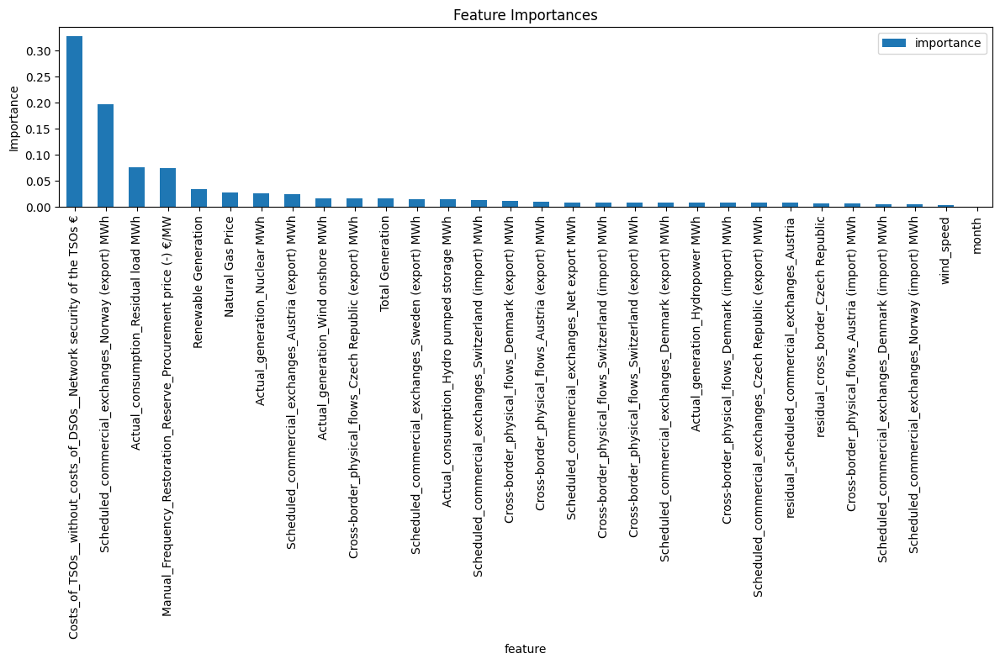

Root Mean Square Error: 0.7455800238213124
Mean Squared Error: 0.5558895719213888
Mean Absolute Error: 0.49054341749711466
R² Score: 0.8496011362543217
-------------------------------- Frequency_Containment_Reserve_Procurement price €/MW
 Automatic_Frequency_Restoration_Reserve_Volume activated (+) MWh
Feature Importances:
                                             feature  importance
1                       Balancing_energy_Price €/MWh     0.51809
2  Automatic_Frequency_Restoration_Reserve_Volume...     0.34071
0         Actual_generation_Hydro pumped storage MWh     0.14120


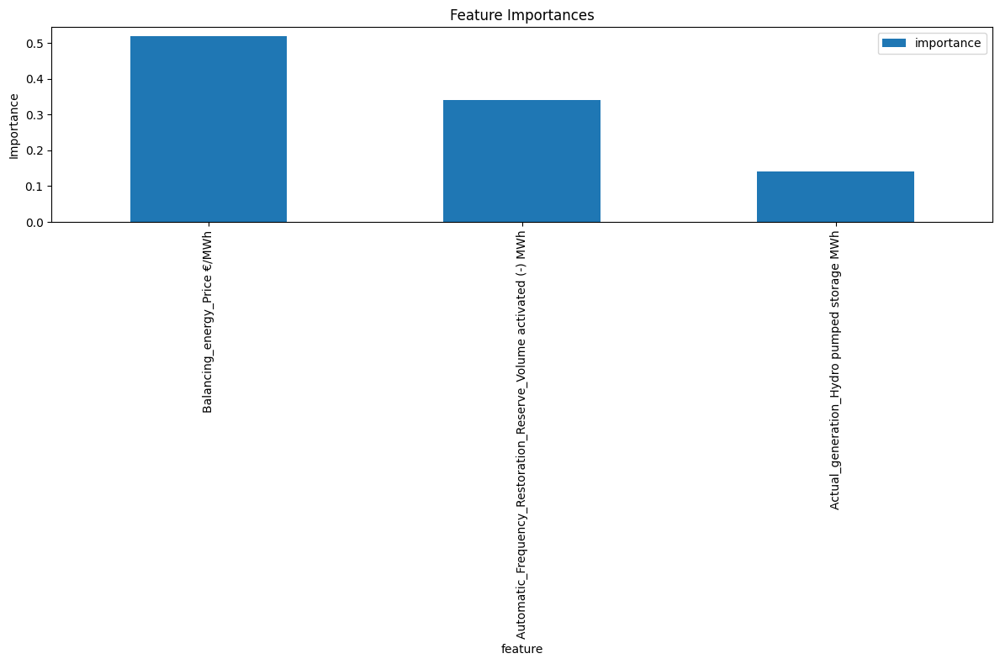

Root Mean Square Error: 19.914067974356048
Mean Squared Error: 396.57010328727324
Mean Absolute Error: 11.886740306727985
R² Score: 0.5211563860373254
 Automatic_Frequency_Restoration_Reserve_Volume activated (-) MWh
Feature Importances:
                                             feature  importance
0                       Balancing_energy_Price €/MWh    0.732175
1  Automatic_Frequency_Restoration_Reserve_Volume...    0.267824


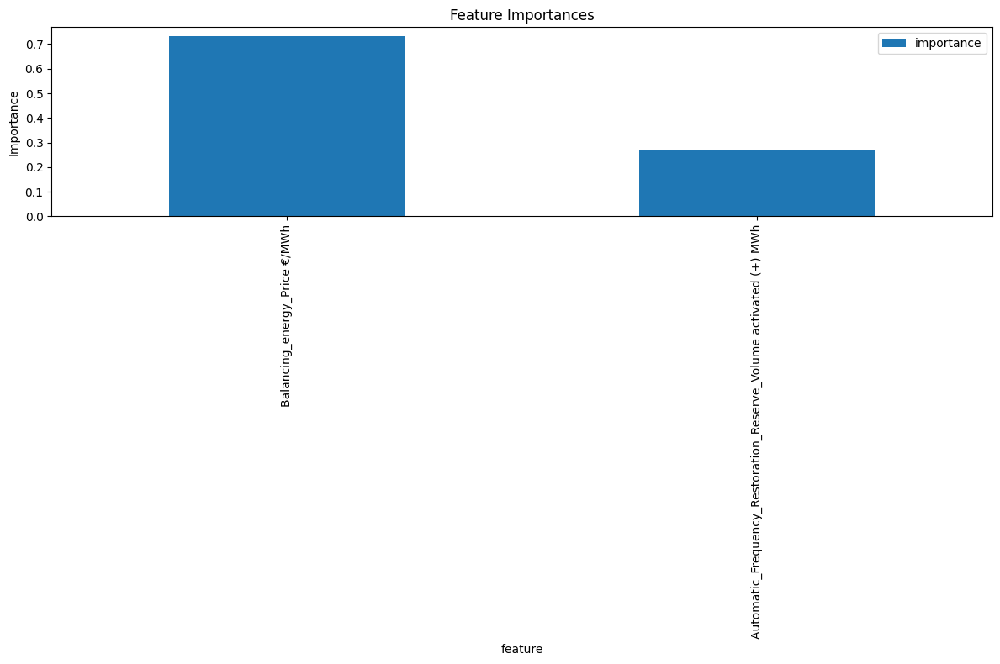

Root Mean Square Error: 25.507505333919468
Mean Squared Error: 650.6328283599302
Mean Absolute Error: 16.112581524355143
R² Score: 0.4716270569966303
 Automatic_Frequency_Restoration_Reserve_Volume procured (+) MW
Feature Importances:
                                             feature  importance
6                       price_lag_168hSlovenia €/MWh    0.266506
1  Costs_of_TSOs__without_costs_of_DSOs__Network ...    0.170005
5                 price_lag_168hNorthern Italy €/MWh    0.148960
7                        price_lag_168hHungary €/MWh    0.114311
4                    price_lag_168hSwitzerland €/MWh    0.105272
0   Cross-border_physical_flows_Austria (export) MWh    0.104037
3                        price_lag_168hAustria €/MWh    0.090910
2                                              month    0.000000


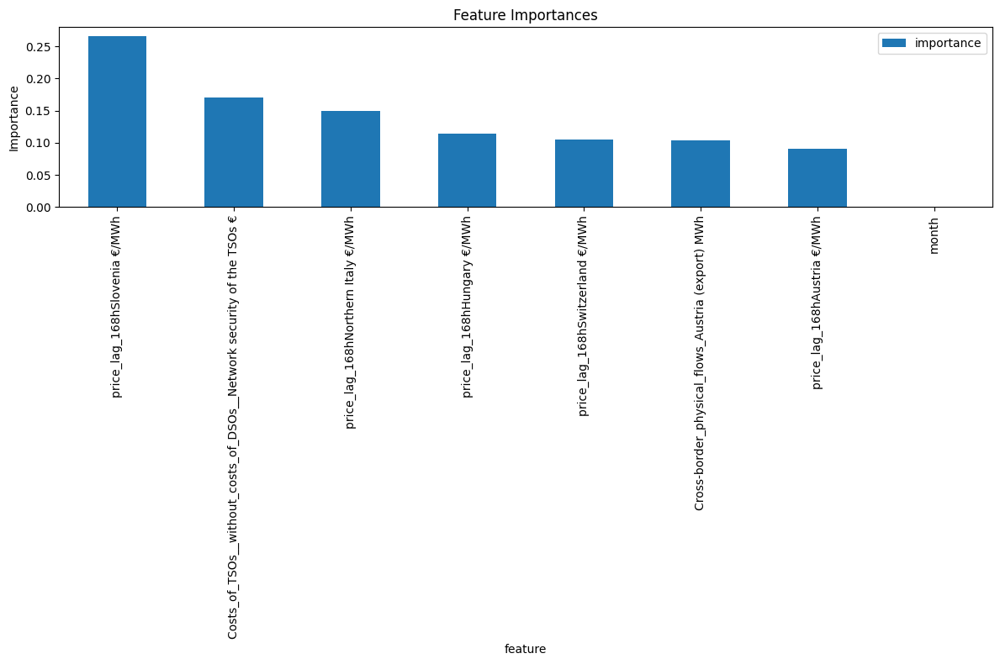

Root Mean Square Error: 173.28520191148039
Mean Squared Error: 30027.761201502522
Mean Absolute Error: 137.22762180060593
R² Score: 0.15098623747419837
 Automatic_Frequency_Restoration_Reserve_Volume procured (-) MW
Feature Importances:
                                              feature  importance
2                       Actual_generation_Biomass MWh    0.176364
14  Costs_of_TSOs__without_costs_of_DSOs__Network ...    0.120543
15  Costs_of_TSOs__without_costs_of_DSOs__Countert...    0.113603
13  Costs_of_TSOs__without_costs_of_DSOs__Balancin...    0.064765
17  Manual_Frequency_Restoration_Reserve_Procureme...    0.062318
20                        price_lag_24hNorway 2 €/MWh    0.054836
5                       Actual_generation_Nuclear MWh    0.045603
7                     Actual_generation_Hard coal MWh    0.038869
8            Actual_generation_Other conventional MWh    0.036860
18                            conventional Generation    0.031344
6                       Actual_genera

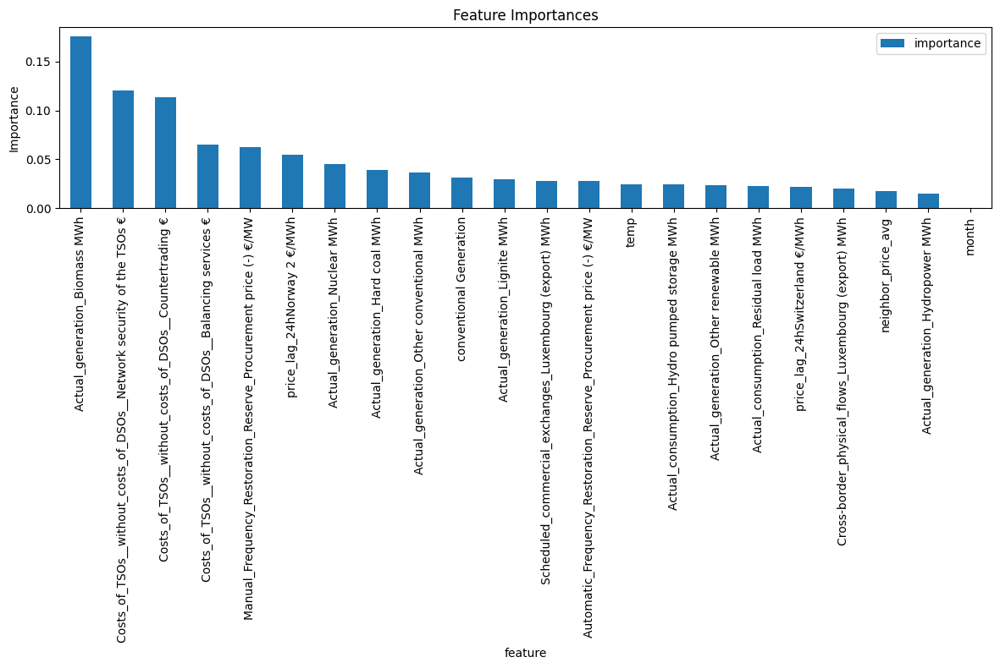

Root Mean Square Error: 114.59921807713876
Mean Squared Error: 13132.980783891606
Mean Absolute Error: 86.40661115393951
R² Score: 0.7169230558382718
 Automatic_Frequency_Restoration_Reserve_Procurement price (+) €/MW
Feature Importances:
                                              feature  importance
2               Actual_generation_Other renewable MWh    0.676098
10  Manual_Frequency_Restoration_Reserve_Procureme...    0.205089
6   Costs_of_TSOs__without_costs_of_DSOs__Balancin...    0.030746
9   Automatic_Frequency_Restoration_Reserve_Procur...    0.028125
5   Cross-border_physical_flows_Switzerland (impor...    0.016264
7   Costs_of_TSOs__without_costs_of_DSOs__Network ...    0.009358
3                       Actual_generation_Nuclear MWh    0.008963
4   Cross-border_physical_flows_Switzerland (expor...    0.008486
0                                                temp    0.007475
1                    Actual_generation_Hydropower MWh    0.006613
8   Costs_of_TSOs__without_costs_of

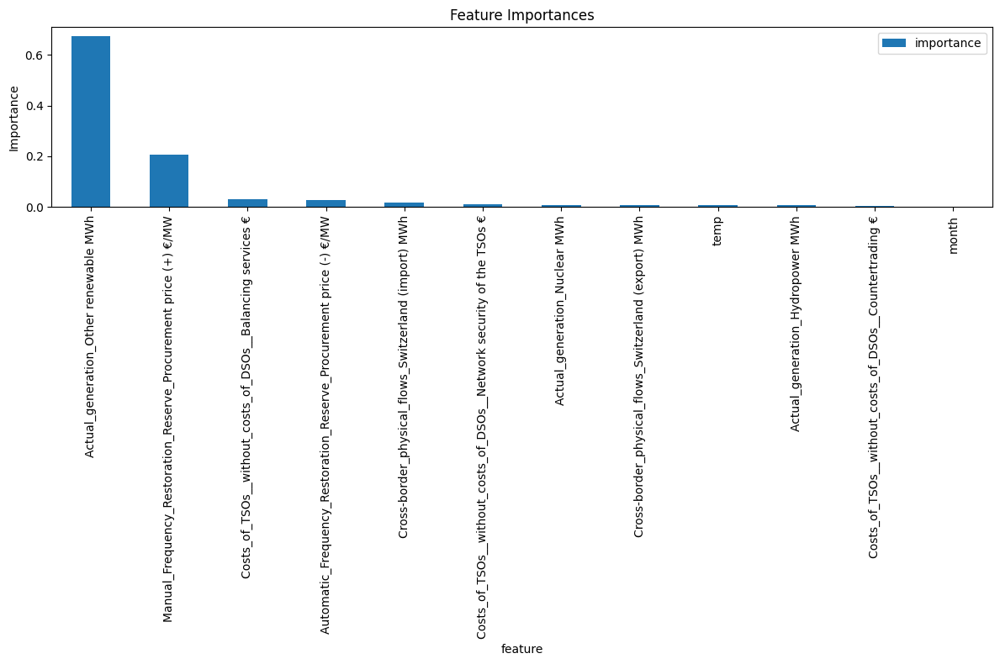

Root Mean Square Error: 0.7425596744923308
Mean Squared Error: 0.5513948701821563
Mean Absolute Error: 0.33574057195760026
R² Score: 0.9626348018059099
-------------------------------- Automatic_Frequency_Restoration_Reserve_Procurement price (+) €/MW
 Automatic_Frequency_Restoration_Reserve_Procurement price (-) €/MW
Feature Importances:
                                              feature  importance
15  Manual_Frequency_Restoration_Reserve_Procureme...    0.541209
14  Automatic_Frequency_Restoration_Reserve_Procur...    0.229612
5               Actual_generation_Other renewable MWh    0.116775
12  Costs_of_TSOs__without_costs_of_DSOs__Countert...    0.024185
10  Costs_of_TSOs__without_costs_of_DSOs__Balancin...    0.017414
11  Costs_of_TSOs__without_costs_of_DSOs__Network ...    0.011795
4                 Actual_generation_Photovoltaics MWh    0.010767
6            Actual_generation_Other conventional MWh    0.009687
0                                  neighbor_price_avg    0.007734

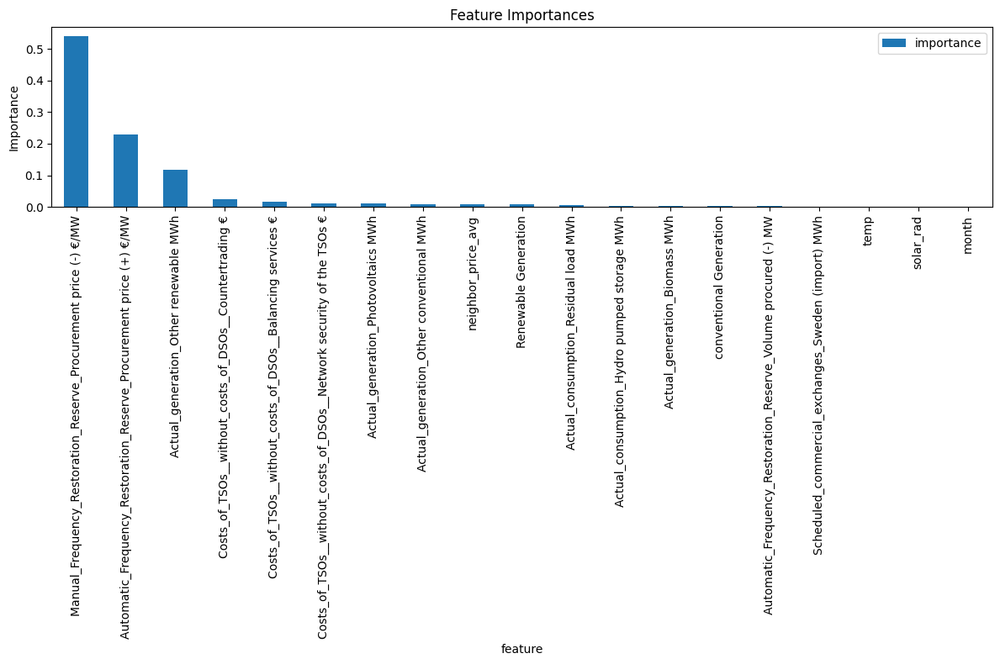

Root Mean Square Error: 1.2153073210452296
Mean Squared Error: 1.4769718845861328
Mean Absolute Error: 0.4246239610049784
R² Score: 0.9441900415137692
 Manual_Frequency_Restoration_Reserve_Volume procured (+) MW
Feature Importances:
                                            feature  importance
1  Cross-border_physical_flows_Austria (export) MWh    0.590096
0     Scheduled_commercial_exchanges_Net export MWh    0.409904


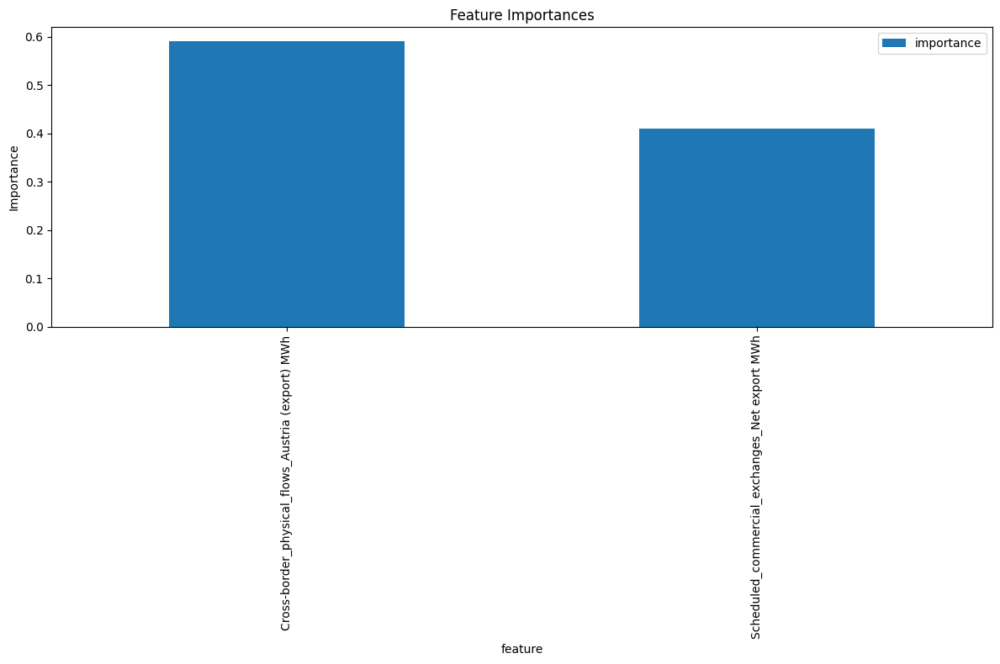

Root Mean Square Error: 71.79570006958404
Mean Squared Error: 5154.6225484816705
Mean Absolute Error: 53.99835542211324
R² Score: -0.10800135976336755
 Manual_Frequency_Restoration_Reserve_Volume procured (-) MW
Feature Importances:
                                             feature  importance
2                    Actual_generation_Hard coal MWh    0.259233
6  Scheduled_commercial_exchanges_Luxembourg (exp...    0.130841
3                   Actual_generation_Fossil gas MWh    0.125015
5               Actual_consumption_Residual load MWh    0.116750
1                      Actual_generation_Lignite MWh    0.109637
4           Actual_consumption_Total (grid load) MWh    0.103164
7                            conventional Generation    0.101590
0                                 neighbor_price_avg    0.053769


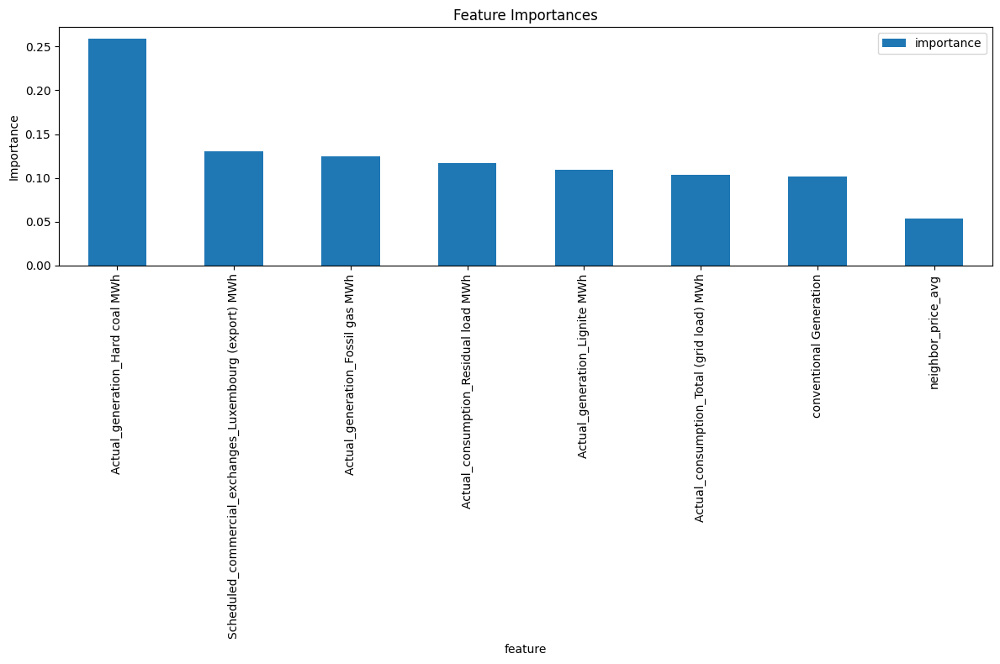

Root Mean Square Error: 38.18529853974219
Mean Squared Error: 1458.1170245692374
Mean Absolute Error: 27.81740901055901
R² Score: 0.4721563877820464
 Manual_Frequency_Restoration_Reserve_Procurement price (+) €/MW
Feature Importances:
                                             feature  importance
4  Automatic_Frequency_Restoration_Reserve_Procur...    0.490187
3  Costs_of_TSOs__without_costs_of_DSOs__Countert...    0.262966
1  Scheduled_commercial_exchanges_Luxembourg (exp...    0.148334
0                   Actual_generation_Hydropower MWh    0.054930
2  Cross-border_physical_flows_Luxembourg (export...    0.043583


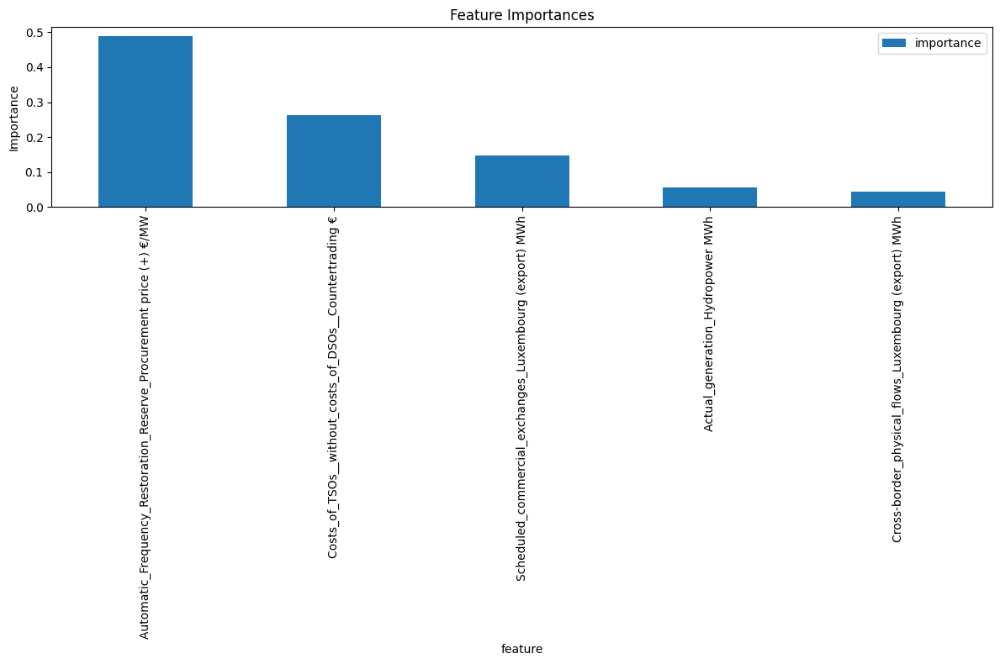

Root Mean Square Error: 0.2547619408814267
Mean Squared Error: 0.06490364652167153
Mean Absolute Error: 0.15501391937692824
R² Score: 0.8339825248576247
-------------------------------- Manual_Frequency_Restoration_Reserve_Procurement price (+) €/MW
 Manual_Frequency_Restoration_Reserve_Procurement price (-) €/MW
Feature Importances:
                                              feature  importance
24  Automatic_Frequency_Restoration_Reserve_Procur...    0.447577
4                 Actual_generation_Photovoltaics MWh    0.230101
19   Cross-border_physical_flows_Denmark (export) MWh    0.051503
9         Actual_consumption_Hydro pumped storage MWh    0.051211
21  Costs_of_TSOs__without_costs_of_DSOs__Countert...    0.045586
7                    Actual_generation_Fossil gas MWh    0.026356
6                       Actual_generation_Lignite MWh    0.021638
0                                  neighbor_price_avg    0.020053
13  Scheduled_commercial_exchanges_Czech Republic ...    0.013647
25  

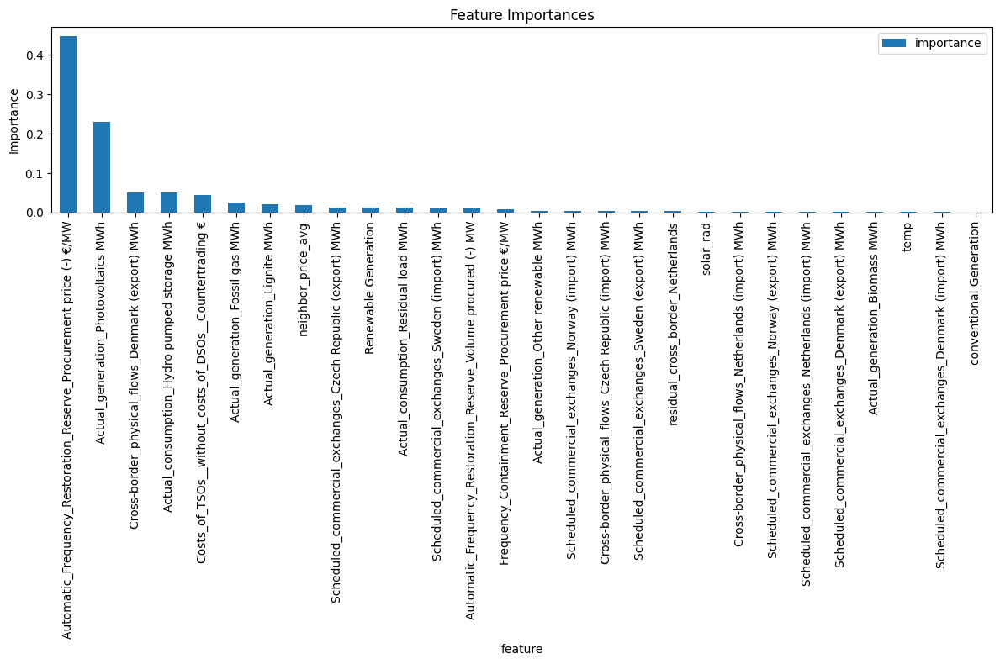

Root Mean Square Error: 0.6222943562788951
Mean Squared Error: 0.3872502658565644
Mean Absolute Error: 0.24065005530352984
R² Score: 0.933313742293448
-------------------------------- Manual_Frequency_Restoration_Reserve_Procurement price (-) €/MW
 Exported_balancing_services_Austria MWh
Feature Importances:
                                   feature  importance
0  Imported_balancing_services_Austria MWh         1.0


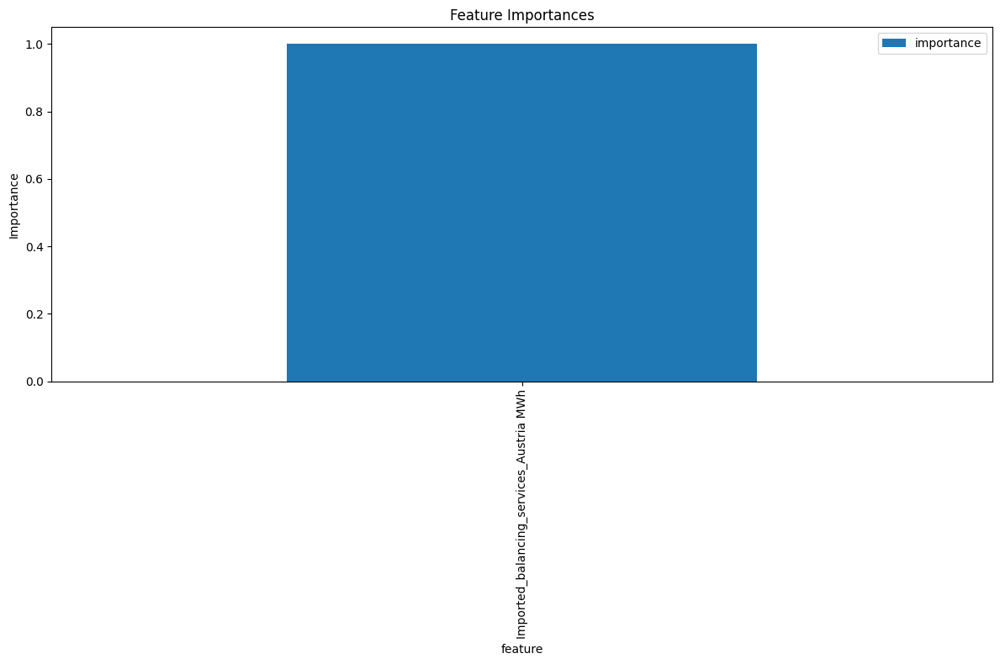

Root Mean Square Error: 8.862435308486742
Mean Squared Error: 78.5427595971125
Mean Absolute Error: 5.370966791655782
R² Score: 0.5150865573604876
 Imported_balancing_services_Austria MWh
Feature Importances:
                                   feature  importance
0  Exported_balancing_services_Austria MWh         1.0


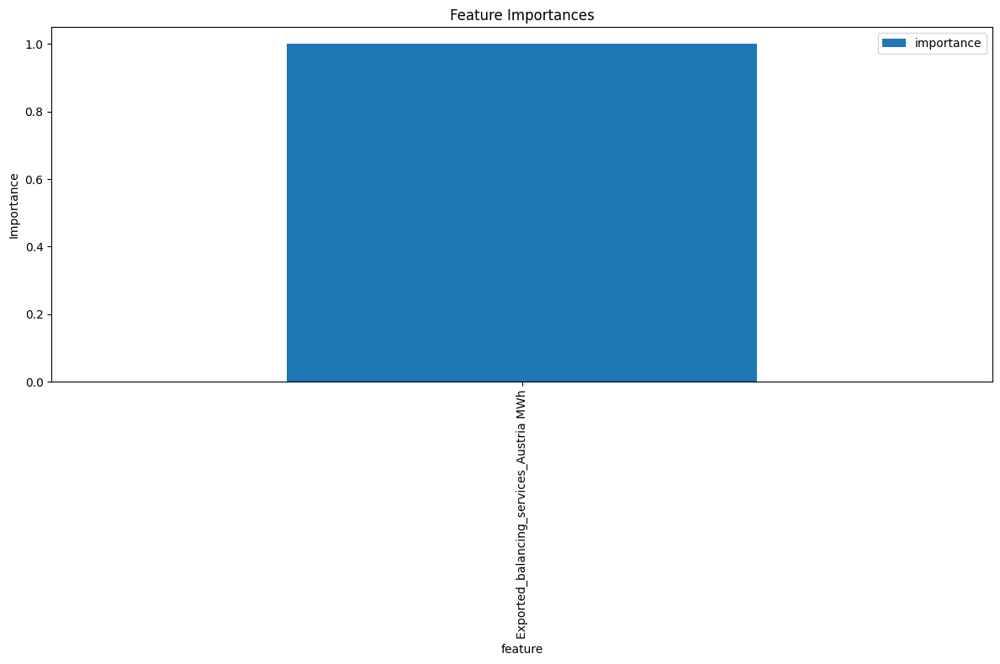

Root Mean Square Error: 8.343925542914812
Mean Squared Error: 69.62109346570624
Mean Absolute Error: 5.278323827751785
R² Score: 0.5422890115762747
 price_lag_24hNorthern Italy €/MWh
Feature Importances:
                                              feature  importance
19                     price_lag_24hSwitzerland €/MWh    0.505082
22                         price_lag_24hHungary €/MWh    0.178615
21                 price_lag_168hNorthern Italy €/MWh    0.053310
11  Costs_of_TSOs__without_costs_of_DSOs__Network ...    0.037194
5    Installed_generation_capacity_Other renewable MW    0.031955
12  Costs_of_TSOs__without_costs_of_DSOs__Countert...    0.031496
2                       Actual_generation_Nuclear MWh    0.021581
13              price_lag_24hGermany/Luxembourg €/MWh    0.015552
3                       Actual_generation_Lignite MWh    0.012951
4                     Actual_generation_Hard coal MWh    0.011930
1               Actual_generation_Other renewable MWh    0.011090
17  

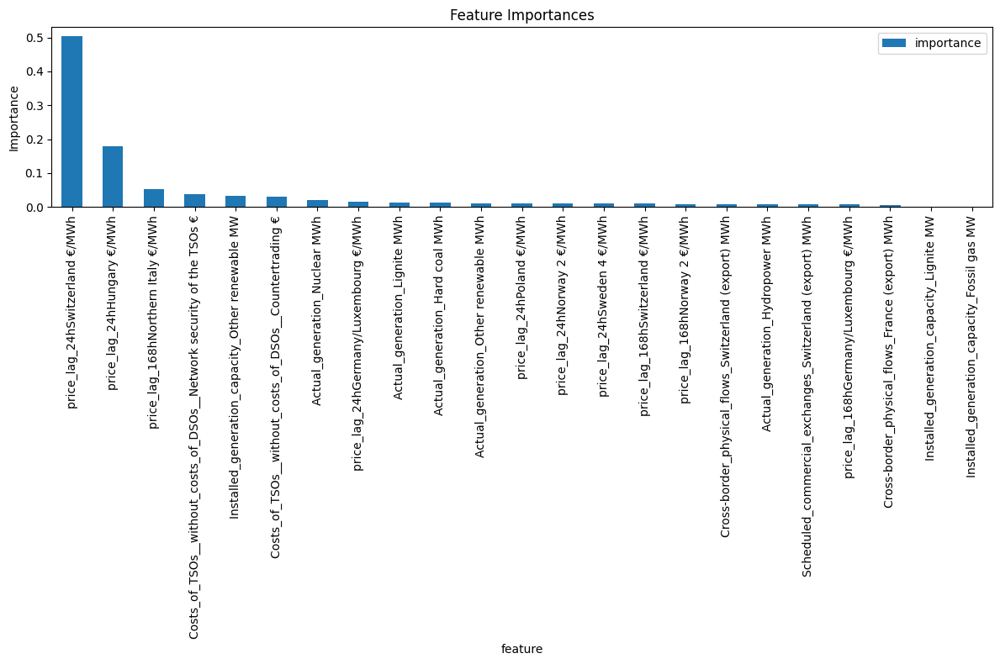

Root Mean Square Error: 12.04688498067684
Mean Squared Error: 145.1274377376572
Mean Absolute Error: 8.661345596520087
R² Score: 0.8735510999046059
 price_lag_168hNorthern Italy €/MWh
Feature Importances:
                                              feature  importance
20                    price_lag_168hSwitzerland €/MWh    0.507483
22                        price_lag_168hHungary €/MWh    0.169004
21                  price_lag_24hNorthern Italy €/MWh    0.054676
10  Costs_of_TSOs__without_costs_of_DSOs__Network ...    0.044195
2                       Actual_generation_Nuclear MWh    0.030583
11  Costs_of_TSOs__without_costs_of_DSOs__Countert...    0.029223
4    Installed_generation_capacity_Other renewable MW    0.015995
16                       price_lag_168hNorway 2 €/MWh    0.014695
14             price_lag_168hGermany/Luxembourg €/MWh    0.012918
19                     price_lag_24hSwitzerland €/MWh    0.012053
17                         price_lag_168hPoland €/MWh    0.011872
15 

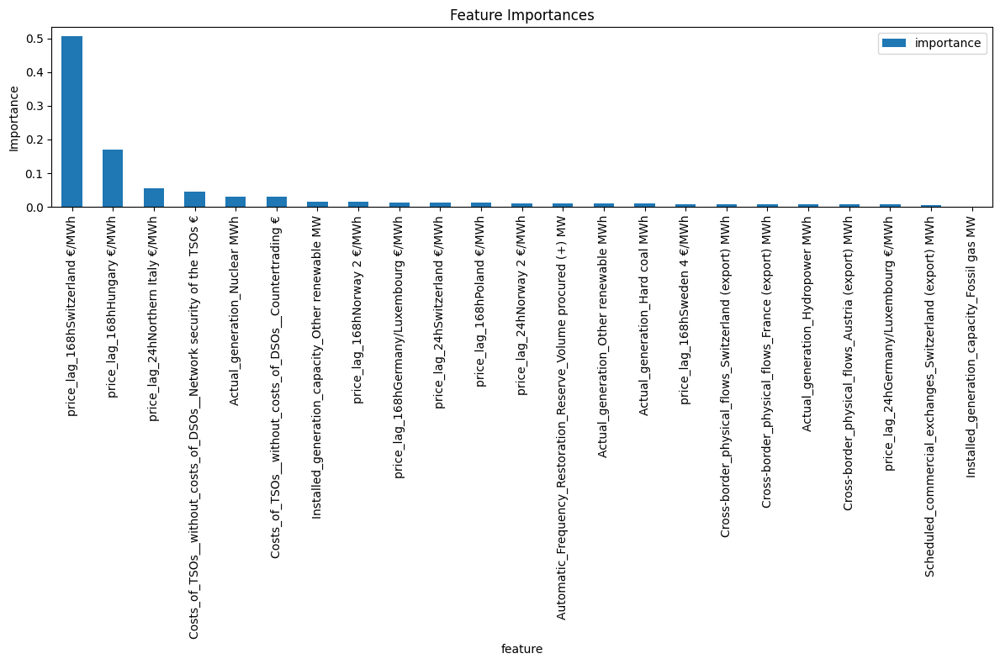

Root Mean Square Error: 12.907361077213153
Mean Squared Error: 166.5999699775571
Mean Absolute Error: 9.19057124720196
R² Score: 0.8546606501860432


In [31]:
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import math
missed_pred = {}
data=df.copy()
data = data.rename(columns=lambda x: x.replace('[', '').replace(']', '').replace(',', ''))
for missed_col, features in features_dict.items():
  if len(features):
    temp = transformed_df.copy()
    features= [s.replace('[', '').replace(']', '').replace(',', '') for s in features]
    missed_col = missed_col.replace('[', '').replace(']', '').replace(',', '')

    if missed_col in features:
      features.remove(missed_col)
    temp = temp.rename(columns=lambda x: x.replace('[', '').replace(']', '').replace(',', ''))

    print(f'{yellow} {missed_col}{reset}')
    # temp[features] = temp[features].fillna(temp[features].median())

    test_features = temp[temp[missed_col].isnull()][features]
    train_features = temp[temp[missed_col].notnull()][features]
    test_target = data[data[missed_col].isnull()][missed_col]
    train_target = data[data[missed_col].notnull()][missed_col]

    X_train, X_val, y_train, y_val = train_test_split(train_features, train_target, test_size=0.2, random_state=42)

    # model = RandomForestRegressor(n_estimators=100, random_state=42)
    model = XGBRegressor(n_estimators=100, random_state=42)
    model.fit(X_train, y_train)

    # Feature importance extraction and visualization
    if hasattr(model, "feature_importances_"):
        importances = model.feature_importances_
        imp_df = pd.DataFrame({'feature': X_train.columns,
                                'importance': importances})
        imp_df.sort_values(by='importance', ascending=False, inplace=True)

        print("Feature Importances:")
        print(imp_df)

        imp_df.plot(kind='bar', x='feature', y='importance', figsize=(12, 8),
                    title="Feature Importances")
        plt.ylabel("Importance")
        plt.tight_layout()
        plt.show()
    else:
        print("The selected model does not support a 'feature_importances_' attribute.")


    y_pred = model.predict(X_val)
    # col_idx = df.columns.get_loc(missed_col)
    # scale = scaler.scale_[col_idx]
    # mean = scaler.mean_[col_idx]
    # y_pred = y_pred.reshape(-1) * scale + mean
    # y_val = y_val.values.reshape(-1) * scale + mean
    mse = mean_squared_error(y_val, y_pred)
    mae = mean_absolute_error(y_val, y_pred)
    r2 = r2_score(y_val, y_pred)
    rmse = math.sqrt(mse)
    print(f"Root Mean Square Error: {rmse}")
    print("Mean Squared Error:", mse)
    print("Mean Absolute Error:", mae)
    print("R² Score:", r2)
    if mse<1 and mae<1 and rmse<1:
      print('--------------------------------', missed_col)
      test_target_pred = pd.DataFrame(model.predict(test_features),
                                       index=test_features.index,
                                       columns=[missed_col])
      missed_pred.update({missed_col: test_target_pred})


In [ ]:
missed_pred

In [49]:
missed_pred.keys()

dict_keys(['Natural Gas Price', 'Frequency_Containment_Reserve_Procurement price €/MW', 'Automatic_Frequency_Restoration_Reserve_Procurement price (+) €/MW', 'Manual_Frequency_Restoration_Reserve_Procurement price (+) €/MW', 'Manual_Frequency_Restoration_Reserve_Procurement price (-) €/MW'])

In [74]:
import pickle
# Save dictionary to a file
with open('misssed_cols_prediction.pkl', 'wb') as file:
    pickle.dump(missed_pred, file)

In [38]:
for col, values in missed_pred.items():
  cols = [c for c in df.columns if col.split(' ')[0] in c]
  print(cols)

['Natural Gas Price']
['Frequency_Containment_Reserve_Procurement price [€/MW]']
['Automatic_Frequency_Restoration_Reserve_Procurement price (+) [€/MW]', 'Automatic_Frequency_Restoration_Reserve_Procurement price (-) [€/MW]']
['Manual_Frequency_Restoration_Reserve_Procurement price (+) [€/MW]', 'Manual_Frequency_Restoration_Reserve_Procurement price (-) [€/MW]']
['Manual_Frequency_Restoration_Reserve_Procurement price (+) [€/MW]', 'Manual_Frequency_Restoration_Reserve_Procurement price (-) [€/MW]']


In [87]:
imputed_cols = ['Natural Gas Price',
'Frequency_Containment_Reserve_Procurement price [€/MW]',
'Automatic_Frequency_Restoration_Reserve_Procurement price (+) [€/MW]',
'Manual_Frequency_Restoration_Reserve_Procurement price (+) [€/MW]',
'Manual_Frequency_Restoration_Reserve_Procurement price (-) [€/MW]']
df[imputed_cols].info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19052 entries, 0 to 19051
Data columns (total 5 columns):
 #   Column                                                                Non-Null Count  Dtype  
---  ------                                                                --------------  -----  
 0   Natural Gas Price                                                     13009 non-null  float64
 1   Frequency_Containment_Reserve_Procurement price [€/MW]                4342 non-null   float64
 2   Automatic_Frequency_Restoration_Reserve_Procurement price (+) [€/MW]  4342 non-null   float64
 3   Manual_Frequency_Restoration_Reserve_Procurement price (+) [€/MW]     4342 non-null   float64
 4   Manual_Frequency_Restoration_Reserve_Procurement price (-) [€/MW]     4342 non-null   float64
dtypes: float64(5)
memory usage: 744.3 KB


In [88]:
df.loc[missed_pred['Natural Gas Price'].index, 'Natural Gas Price'] = missed_pred['Natural Gas Price']['Natural Gas Price']
df.loc[missed_pred['Frequency_Containment_Reserve_Procurement price €/MW'].index,'Frequency_Containment_Reserve_Procurement price [€/MW]'] = missed_pred['Frequency_Containment_Reserve_Procurement price €/MW']['Frequency_Containment_Reserve_Procurement price €/MW']
df.loc[missed_pred['Automatic_Frequency_Restoration_Reserve_Procurement price (+) €/MW'].index,'Automatic_Frequency_Restoration_Reserve_Procurement price (+) [€/MW]'] = missed_pred['Automatic_Frequency_Restoration_Reserve_Procurement price (+) €/MW']['Automatic_Frequency_Restoration_Reserve_Procurement price (+) €/MW']
df.loc[missed_pred['Manual_Frequency_Restoration_Reserve_Procurement price (+) €/MW'].index,'Manual_Frequency_Restoration_Reserve_Procurement price (+) [€/MW]'] = missed_pred['Manual_Frequency_Restoration_Reserve_Procurement price (+) €/MW']['Manual_Frequency_Restoration_Reserve_Procurement price (+) €/MW']
df.loc[missed_pred['Manual_Frequency_Restoration_Reserve_Procurement price (-) €/MW'].index,'Manual_Frequency_Restoration_Reserve_Procurement price (-) [€/MW]'] = missed_pred['Manual_Frequency_Restoration_Reserve_Procurement price (-) €/MW']['Manual_Frequency_Restoration_Reserve_Procurement price (-) €/MW']

In [92]:

df[imputed_cols].info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19052 entries, 0 to 19051
Data columns (total 5 columns):
 #   Column                                                                Non-Null Count  Dtype  
---  ------                                                                --------------  -----  
 0   Natural Gas Price                                                     19052 non-null  float64
 1   Frequency_Containment_Reserve_Procurement price [€/MW]                19052 non-null  float64
 2   Automatic_Frequency_Restoration_Reserve_Procurement price (+) [€/MW]  19052 non-null  float64
 3   Manual_Frequency_Restoration_Reserve_Procurement price (+) [€/MW]     19052 non-null  float64
 4   Manual_Frequency_Restoration_Reserve_Procurement price (-) [€/MW]     19052 non-null  float64
dtypes: float64(5)
memory usage: 744.3 KB


In [93]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
transformed_df = pd.DataFrame()
price_cols = [col for col in df.columns if 'day-ahead_prices' in col.lower()]
std_cols = [col for col in df.columns if col not in price_cols]

transformed_df = df.copy()
transformed_df[std_cols] = scaler.fit_transform(transformed_df[std_cols])

transformed_df.to_csv('transformed_imputed_5_features.csv', index=False)

#### iterative_imputer

In [ ]:
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.ensemble import ExtraTreesRegressor

imputer = IterativeImputer(
    estimator=ExtraTreesRegressor(n_estimators=20),  # More robust than linear models
    max_iter=5,                                      # Increase iterations for better convergence
    random_state=42,                                  # For reproducibility
    initial_strategy='median',                        # May be more robust than mean for skewed distributions
    imputation_order='ascending'                      # Start with columns having fewer missing values
)

imputed_data = imputer.fit_transform(df[unique_features])


ValueError: Shape of passed values is (19052, 50), indices imply (19052, 164)

In [ ]:
imputed_df = pd.DataFrame(imputed_data, columns=df[unique_features].columns)
imputed_df

,Costs_of_TSOs__without_costs_of_DSOs__Countertrading [€],Cross-border_physical_flows_Belgium (import) [MWh],Cross-border_physical_flows_France (export) [MWh],Cross-border_physical_flows_Switzerland (export) [MWh],Scheduled_commercial_exchanges_Switzerland (export) [MWh],Actual_generation_Photovoltaics [MWh],price_lag_24hSwitzerland [€/MWh],Scheduled_commercial_exchanges_France (import) [MWh],Scheduled_commercial_exchanges_Net export [MWh],price_lag_24hNorway 2 [€/MWh],...,price_lag_24hGermany/Luxembourg [€/MWh],price_lag_168hBelgium [€/MWh],price_lag_24hSweden 4 [€/MWh],Costs_of_TSOs__without_costs_of_DSOs__Network security of the TSOs [€],solar_rad,Scheduled_commercial_exchanges_Switzerland (import) [MWh],Natural Gas Price,Actual_generation_Hard coal [MWh],temp,Actual_generation_Other renewable [MWh]
0,1.751942e+07,-108.687500,430.3125,607.3750,199.3550,0.2500,94.87,0.0000,3668.7950,58.95,...,90.60,88.04,48.125,3.982759e+08,0.00,0.00,3.3720,514.1250,15.2,32.3125
1,1.751942e+07,-38.062500,494.8750,582.6250,198.3025,0.3125,94.87,0.0000,4026.1525,58.95,...,90.60,88.04,48.125,3.982759e+08,0.00,0.00,3.3720,509.4375,14.5,32.2500
2,1.751942e+07,0.000000,393.6875,539.4375,181.2025,0.2500,94.87,0.0000,3648.5950,58.95,...,90.60,88.04,48.125,3.982759e+08,0.00,0.00,3.3850,508.9375,13.6,32.2500
3,1.751942e+07,0.000000,366.3750,603.6250,164.2550,0.3750,94.87,0.0000,3602.0125,58.95,...,90.60,88.04,48.125,3.982759e+08,0.00,0.00,3.4395,509.6250,14.3,32.1250
4,1.751942e+07,0.000000,363.0000,600.2500,188.1400,0.3750,94.87,0.0000,3463.9325,58.95,...,90.60,88.04,48.125,3.982759e+08,0.00,0.00,3.4210,509.5000,14.1,32.1875
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19047,1.684297e+07,-148.666667,0.0000,20.7500,199.7025,37.5625,98.55,-336.9350,-1119.5350,26.34,...,14.34,104.12,3.850,2.466522e+08,20.25,-4.33,4.3900,781.5625,0.3,27.2500
19048,1.839134e+07,-61.312500,0.0000,109.6250,235.7925,37.5625,106.53,-375.8125,-390.1900,33.02,...,52.31,103.17,5.480,2.677941e+08,23.50,0.00,4.3900,781.5625,0.0,27.2500
19049,1.912253e+07,-61.312500,0.0000,109.6250,237.4850,37.5625,121.05,-364.9375,-66.1625,34.64,...,81.29,100.00,12.090,2.659052e+08,29.50,0.00,4.3900,781.5625,-1.1,27.2500
19050,2.020407e+07,-61.312500,0.0000,109.6250,209.3750,37.5625,138.19,-88.8750,406.9375,34.94,...,111.15,103.65,17.290,2.645563e+08,30.35,0.00,4.3900,781.5625,-1.7,27.2500


In [ ]:
sparse_cols.info()

<class 'pandas.core.frame.DataFrame'>
Index: 19052 entries, 2023-01-01 01:00:00 to 2025-03-05 00:00:00
Data columns (total 15 columns):
 #   Column                                                                Non-Null Count  Dtype  
---  ------                                                                --------------  -----  
 0   Actual_generation_Nuclear [MWh]                                       9466 non-null   float64
 1   Installed_generation_capacity_Nuclear [MW]                            8758 non-null   float64
 2   Frequency_Containment_Reserve_Procurement price [€/MW]                4342 non-null   float64
 3   Automatic_Frequency_Restoration_Reserve_Volume activated (+) [MWh]    7501 non-null   float64
 4   Automatic_Frequency_Restoration_Reserve_Volume activated (-) [MWh]    7501 non-null   float64
 5   Automatic_Frequency_Restoration_Reserve_Volume procured (+) [MW]      4342 non-null   float64
 6   Automatic_Frequency_Restoration_Reserve_Volume procured (-) [MW]   

In [ ]:
sparse_cols.reset_index(inplace=True)

In [ ]:
sparse_cols[sparse_cols.columns]

,End date,Actual_generation_Nuclear [MWh],Installed_generation_capacity_Nuclear [MW],Frequency_Containment_Reserve_Procurement price [€/MW],Automatic_Frequency_Restoration_Reserve_Volume activated (+) [MWh],Automatic_Frequency_Restoration_Reserve_Volume activated (-) [MWh],Automatic_Frequency_Restoration_Reserve_Volume procured (+) [MW],Automatic_Frequency_Restoration_Reserve_Volume procured (-) [MW],Automatic_Frequency_Restoration_Reserve_Procurement price (+) [€/MW],Automatic_Frequency_Restoration_Reserve_Procurement price (-) [€/MW],Manual_Frequency_Restoration_Reserve_Volume procured (+) [MW],Manual_Frequency_Restoration_Reserve_Volume procured (-) [MW],Manual_Frequency_Restoration_Reserve_Procurement price (+) [€/MW],Manual_Frequency_Restoration_Reserve_Procurement price (-) [€/MW],Exported_balancing_services_Austria [MWh],Imported_balancing_services_Austria [MWh]
0,2023-01-01 01:00:00,614.6250,4056.0,8.71,59.8125,2.8125,1941.00,2029.00,0.520,7.52,977.0,355.00,0.060,1.6600,29.8125,0.0000
1,2023-01-01 02:00:00,614.9375,4056.0,8.71,1.2500,29.5625,1941.00,2029.00,0.520,7.52,977.0,355.00,0.060,1.6600,21.3125,0.0000
2,2023-01-01 03:00:00,615.0000,4056.0,8.71,0.0000,75.8750,1941.00,2029.00,0.520,7.52,977.0,355.00,0.060,1.6600,19.5625,0.0000
3,2023-01-01 04:00:00,615.2500,4056.0,8.80,0.6875,31.8750,1943.25,1966.75,0.655,7.34,1008.5,363.25,0.075,1.6675,14.2500,0.0625
4,2023-01-01 05:00:00,616.0000,4056.0,8.83,0.0000,34.3750,1944.00,1946.00,0.700,7.28,1019.0,366.00,0.080,1.6700,0.1875,17.2500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19047,2025-03-04 20:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
19048,2025-03-04 21:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
19049,2025-03-04 22:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
19050,2025-03-04 23:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
for column in sparse_cols.columns:
  if sparse_cols[column].isnull().sum:
    flag_column_name = f"{column}_is_nan"
    sparse_cols[flag_column_name] = sparse_cols[column].isna().astype(int)
sparse_cols

,End date,Actual_generation_Nuclear [MWh],Installed_generation_capacity_Nuclear [MW],Frequency_Containment_Reserve_Procurement price [€/MW],Automatic_Frequency_Restoration_Reserve_Volume activated (+) [MWh],Automatic_Frequency_Restoration_Reserve_Volume activated (-) [MWh],Automatic_Frequency_Restoration_Reserve_Volume procured (+) [MW],Automatic_Frequency_Restoration_Reserve_Volume procured (-) [MW],Automatic_Frequency_Restoration_Reserve_Procurement price (+) [€/MW],Automatic_Frequency_Restoration_Reserve_Procurement price (-) [€/MW],...,Automatic_Frequency_Restoration_Reserve_Volume procured (+) [MW]_is_nan,Automatic_Frequency_Restoration_Reserve_Volume procured (-) [MW]_is_nan,Automatic_Frequency_Restoration_Reserve_Procurement price (+) [€/MW]_is_nan,Automatic_Frequency_Restoration_Reserve_Procurement price (-) [€/MW]_is_nan,Manual_Frequency_Restoration_Reserve_Volume procured (+) [MW]_is_nan,Manual_Frequency_Restoration_Reserve_Volume procured (-) [MW]_is_nan,Manual_Frequency_Restoration_Reserve_Procurement price (+) [€/MW]_is_nan,Manual_Frequency_Restoration_Reserve_Procurement price (-) [€/MW]_is_nan,Exported_balancing_services_Austria [MWh]_is_nan,Imported_balancing_services_Austria [MWh]_is_nan
0,2023-01-01 01:00:00,614.6250,4056.0,8.71,59.8125,2.8125,1941.00,2029.00,0.520,7.52,...,0,0,0,0,0,0,0,0,0,0
1,2023-01-01 02:00:00,614.9375,4056.0,8.71,1.2500,29.5625,1941.00,2029.00,0.520,7.52,...,0,0,0,0,0,0,0,0,0,0
2,2023-01-01 03:00:00,615.0000,4056.0,8.71,0.0000,75.8750,1941.00,2029.00,0.520,7.52,...,0,0,0,0,0,0,0,0,0,0
3,2023-01-01 04:00:00,615.2500,4056.0,8.80,0.6875,31.8750,1943.25,1966.75,0.655,7.34,...,0,0,0,0,0,0,0,0,0,0
4,2023-01-01 05:00:00,616.0000,4056.0,8.83,0.0000,34.3750,1944.00,1946.00,0.700,7.28,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19047,2025-03-04 20:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1,1,1,1,1,1,1,1,1,1
19048,2025-03-04 21:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1,1,1,1,1,1,1,1,1,1
19049,2025-03-04 22:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1,1,1,1,1,1,1,1,1,1
19050,2025-03-04 23:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1,1,1,1,1,1,1,1,1,1


In [ ]:
imputed_df[sparse_cols.columns] = sparse_cols[sparse_cols.columns]

In [ ]:
imputed_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19052 entries, 0 to 19051
Data columns (total 98 columns):
 #   Column                                                                       Non-Null Count  Dtype  
---  ------                                                                       --------------  -----  
 0   Costs_of_TSOs__without_costs_of_DSOs__Countertrading [€]                     19052 non-null  float64
 1   Cross-border_physical_flows_Belgium (import) [MWh]                           19052 non-null  float64
 2   Cross-border_physical_flows_France (export) [MWh]                            19052 non-null  float64
 3   Cross-border_physical_flows_Switzerland (export) [MWh]                       19052 non-null  float64
 4   Scheduled_commercial_exchanges_Switzerland (export) [MWh]                    19052 non-null  float64
 5   Actual_generation_Photovoltaics [MWh]                                        19052 non-null  float64
 6   price_lag_24hSwitzerland [€/MWh]      

In [ ]:
df.reset_index(inplace=True)


In [ ]:
price_cols = [col for col in df.columns if 'day-ahead_prices' in col.lower()]
imputed_df[price_cols]= df[price_cols]

In [ ]:
imputed_df.to_csv('imputed_df_19052_98.csv', index=False)